In [1]:
# Standard library imports
from datetime import datetime as dt
import time
from os import listdir

# Third-party library imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# NLTK imports
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# PyMongo imports
import pymongo
from pymongo import MongoClient

# Scikit-learn imports
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import MinMaxScaler

# TensorFlow imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

2024-10-20 15:57:40.975371: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [185]:
import mlutils

In [2]:
def do_basic_cleanup(df, drop_cols):
    df = df.rename(columns={c: c.lower().replace(" ", "_").replace("(", "").replace(")", "") for c in df.columns})
    try:
      df = df.drop(columns=drop_cols)
    except Exception as e:
      print(e)
    return df


def get_df_from_dir(dir_name, cols_to_drop=[]):
    df = pd.DataFrame()
    for file in listdir(dir_name):
      try:
          df_part = pd.read_csv(f"{dir_name}/" + file, on_bad_lines='warn')
          df_part = do_basic_cleanup(df_part, cols_to_drop)
          if 'ticker' not in df_part.columns:
            ticker = file.split('.')[0]
            df_part['ticker'] = [ticker for i in range(0, df_part.shape[0])]
          print(file, df_part.shape)
          df = pd.concat([df, df_part], ignore_index=True)
      except Exception as e:
         print(e)
    return df

def filter_df(df, item, metric, area, year=0):
    return df[(df.value > 0.0) & (df.item == item) & (df.element == metric) & (df.area == area) & (df.year >= year)]

In [3]:
sentiment_df = get_df_from_dir('data/stock-tweet-and-price/stocktweet', ['id'])
sentiment_df.head()

stocktweet.csv (10000, 3)


,date,ticker,tweet
0,01/01/2020,AMZN,$AMZN Dow futures up by 100 points already 🥳
1,01/01/2020,TSLA,$TSLA Daddy's drinkin' eArly tonight! Here's t...
2,01/01/2020,AAPL,$AAPL We’ll been riding since last December fr...
3,01/01/2020,TSLA,"$TSLA happy new year, 2020, everyone🍷🎉🙏"
4,01/01/2020,TSLA,"$TSLA haha just a collection of greats...""Mars..."


In [4]:
sentiment_df.shape

(10000, 3)

In [5]:
stocks_df = get_df_from_dir('data/stock-tweet-and-price/stockprice')
print(stocks_df.head())
print(stocks_df.tail())

BA.csv (254, 8)
TM.csv (254, 8)
V.csv (254, 8)
BAC.csv (254, 8)
LOW.csv (254, 8)
BKNG.csv (254, 8)
TSM.csv (254, 8)
ABNB.csv (15, 8)
SBUX.csv (254, 8)
AMT.csv (254, 8)
PG.csv (254, 8)
MCD.csv (254, 8)
AMZN.csv (254, 8)
KO.csv (254, 8)
PYPL.csv (254, 8)
UPS.csv (254, 8)
MSFT.csv (254, 8)
CCL.csv (254, 8)
NVDA.csv (254, 8)
HD.csv (254, 8)
XOM.csv (254, 8)
CVX.csv (254, 8)
NKE.csv (254, 8)
FB.csv (254, 8)
DIS.csv (254, 8)
NFLX.csv (254, 8)
JPM.csv (254, 8)
TSLA.csv (254, 8)
GOOGL.csv (254, 8)
META.csv (254, 8)
GOOG.csv (254, 8)
GSPC.csv (254, 8)
PFE.csv (254, 8)
BABA.csv (254, 8)
UNH.csv (254, 8)
MA.csv (254, 8)
BRK-A.csv (254, 8)
AAPL.csv (254, 8)
WMT.csv (254, 8)
BRK-B.csv (254, 8)
JNJ.csv (254, 8)
         date        open        high         low       close   adj_close  \
0  2019-12-31  325.410004  326.570007  323.320007  325.760010  323.833313   
1  2020-01-02  328.549988  333.350006  327.700012  333.320007  331.348572   
2  2020-01-03  330.630005  334.890015  330.299988  332.760010 

In [6]:
# Remove entries with empty values
sentiment_df = sentiment_df.dropna()

# Convert the 'date' column in sentiment_df to the format YYYY-MM-DD
sentiment_df['date'] = pd.to_datetime(sentiment_df['date'], format='%d/%m/%Y').dt.strftime('%Y-%m-%d')
print(sentiment_df['date'].to_list()[0:20])


['2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-01', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-02', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03', '2020-01-03']


In [7]:
stocks_df.head()

,date,open,high,low,close,adj_close,volume,ticker
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA


In [8]:
stocks_df.shape

(10175, 8)

In [9]:
sentiment_df.head()

,date,ticker,tweet
0,2020-01-01,AMZN,$AMZN Dow futures up by 100 points already 🥳
1,2020-01-01,TSLA,$TSLA Daddy's drinkin' eArly tonight! Here's t...
2,2020-01-01,AAPL,$AAPL We’ll been riding since last December fr...
3,2020-01-01,TSLA,"$TSLA happy new year, 2020, everyone🍷🎉🙏"
4,2020-01-01,TSLA,"$TSLA haha just a collection of greats...""Mars..."


In [10]:
# Group by ticker and count the number of items in each group
grouped_counts = sentiment_df.groupby(['ticker', 'date']).size().reset_index(name='counts')
print(grouped_counts)

     ticker        date  counts
0      AAPL  2020-01-01       1
1      AAPL  2020-01-02       8
2      AAPL  2020-01-03       6
3      AAPL  2020-01-06       2
4      AAPL  2020-01-07       3
...     ...         ...     ...
2330    XOM  2020-10-22       1
2331    XOM  2020-10-29       2
2332    XOM  2020-11-07       1
2333    XOM  2020-11-17       1
2334    XOM  2020-11-25       1

[2335 rows x 3 columns]


Observation: multiple sentiments extracted per stock per date, but a lot of them are missign alltogether, when doing a groupby: 2335 in sentiment (group is ticker + date) vs 10175 in stocks.

In [13]:
sentiment_df.groupby(['ticker', 'date'])

In [15]:
# Group by 'ticker' and 'date' and perform the aggregations
aggregated_df = sentiment_df.groupby(['ticker', 'date']).agg(
    num_tweets=('tweet', 'size'),  # Count the number of entries in each group
    concatenated_tweets=('tweet', lambda x: ' '.join(x))  # Concatenate the 'tweet' column into a single column
).reset_index()

# Display the result
print(aggregated_df)

     ticker        date  num_tweets  \
0      AAPL  2020-01-01           1   
1      AAPL  2020-01-02           8   
2      AAPL  2020-01-03           6   
3      AAPL  2020-01-06           2   
4      AAPL  2020-01-07           3   
...     ...         ...         ...   
2330    XOM  2020-10-22           1   
2331    XOM  2020-10-29           2   
2332    XOM  2020-11-07           1   
2333    XOM  2020-11-17           1   
2334    XOM  2020-11-25           1   

                                    concatenated_tweets  
0     $AAPL We’ll been riding since last December fr...  
1     $AAPL $300 calls First trade of 2020 Congrats ...  
2     $AAPL tomorrow buy time on the dip then green ...  
3     $AAPL it’s just too funny and easy to laugh at...  
4     $AAPL Bears & Shorts Later Today 😂😂😂 $AAPL who...  
...                                                 ...  
2330                   $XOM dividend cut is coming ? 😖🤑  
2331  $XOM must be one of the ugliest charts I have ...  
2332     

In [17]:
sentiment_df = aggregated_df

## Sentiment Analysis: Vader & BERT scores

### Vader

In [19]:
# Documentation https://www.nltk.org/_modules/nltk/sentiment/vader.html
# DO NOT FORGET TO CITE THIS in the REPORT!!!
# https://github.com/cjhutto/vaderSentiment?tab=readme-ov-file#citation-information

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to apply VADER and return sentiment scores
def get_vader_scores(text):
    scores = analyzer.polarity_scores(text)
    return pd.Series(scores['compound'])

# Assuming 'text_column' is the column in merged_df containing the text data
# Apply the function to the text column and create new columns for the sentiment scores
sentiment_df['v_comp'] = sentiment_df['concatenated_tweets'].apply(get_vader_scores)

def compound_score_to_label(score):
    if score >= 0.25:
        return 'POS'
    if score <= -0.25:
        return 'NEG'
    return 'NEU'

sentiment_df['vader_label'] = sentiment_df.v_comp.apply(lambda score: compound_score_to_label(score))
sentiment_df.head()

,ticker,date,num_tweets,concatenated_tweets,v_comp,vader_label
0,AAPL,2020-01-01,1,$AAPL We’ll been riding since last December fr...,0.0000,NEU
1,AAPL,2020-01-02,8,$AAPL $300 calls First trade of 2020 Congrats ...,0.9596,POS
2,AAPL,2020-01-03,6,$AAPL tomorrow buy time on the dip then green ...,0.1739,NEU
3,AAPL,2020-01-06,2,$AAPL it’s just too funny and easy to laugh at...,0.9501,POS
4,AAPL,2020-01-07,3,$AAPL Bears & Shorts Later Today 😂😂😂 $AAPL who...,0.3578,POS


### BERT

In [32]:
# pip install datasets transformers huggingface_hub

In [27]:
# https://huggingface.co/finiteautomata/bertweet-base-sentiment-analysis
# https://github.com/pysentimiento/pysentimiento

In [40]:
# pip install -U transformers==4.39.2 requests

  Using cached tokenizers-0.15.2-cp311-cp311-macosx_10_12_x86_64.whl.metadata (6.7 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 12.5 MB/s eta 0:00:00a 0:00:01
Using cached tokenizers-0.15.2-cp311-cp311-macosx_10_12_x86_64.whl (2.6 MB)
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.20.1
    Uninstalling tokenizers-0.20.1:
      Successfully uninstalled tokenizers-0.20.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.45.2
    Uninstalling transformers-4.45.2:
      Successfully uninstalled transformers-4.45.2
Note: you may need to restart the kernel to use updated packages.


In [2]:
# pip install --upgrade huggingface-hub

In [20]:
from transformers import pipeline
from transformers import BertTokenizer, BertForSequenceClassification
import torch

torch.cuda.is_available()

False

In [24]:
%time
bert_sentiment_analysis = pipeline(model="finiteautomata/bertweet-base-sentiment-analysis")

CPU times: user 3 μs, sys: 1 μs, total: 4 μs
Wall time: 11 μs


In [29]:
%time
scores_bert = []


for tw in sentiment_df.concatenated_tweets.to_list():
    scores = {}
    try:
        score = bert_sentiment_analysis(tw)
        scores['bert_label'] = score[0]['label']
        scores['bert_score'] = score[0]['score']
    except Exception as e:
        print(e)
        scores['bert_label'] = ''
        scores['bert_score'] = 0
    scores_bert.append(scores)

CPU times: user 9 μs, sys: 13 μs, total: 22 μs
Wall time: 137 μs
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of range in self
index out of rang

In [30]:
scores_bert_df = pd.DataFrame(list(scores_bert))
sentiment_df = pd.concat([sentiment_df, scores_bert_df], axis=1)
sentiment_df.head()

,ticker,date,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
0,AAPL,2020-01-01,1,$AAPL We’ll been riding since last December fr...,0.0000,NEU,NEU,0.966015
1,AAPL,2020-01-02,8,$AAPL $300 calls First trade of 2020 Congrats ...,0.9596,POS,,0.000000
2,AAPL,2020-01-03,6,$AAPL tomorrow buy time on the dip then green ...,0.1739,NEU,NEU,0.607224
3,AAPL,2020-01-06,2,$AAPL it’s just too funny and easy to laugh at...,0.9501,POS,NEG,0.642878
4,AAPL,2020-01-07,3,$AAPL Bears & Shorts Later Today 😂😂😂 $AAPL who...,0.3578,POS,NEG,0.615121


### Combine the Market data with sentiment data

In [31]:
# Merge sentiment_df with stocks_df on both 'ticker' and 'date' columns
merged_df = pd.merge(stocks_df, sentiment_df, on=['ticker', 'date'], how='left')
merged_df.shape

(10175, 14)

In [32]:
# Display the merged DataFrame
merged_df.head()

,date,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,2.0,$BA Stocks usually look bearish until they do...,0.6249,POS,NEU,0.64698


### Preprocessing the data

K-Nearest Neighbors (KNN) imputation is a method used to fill in missing values in a dataset by leveraging the similarity between data points. Here are some scenarios and reasons for using KNN imputation.

When to Use KNN Imputation
1. Missing Data in Numerical Columns: KNN imputation is particularly useful for numerical data where the missing values can be estimated based on the values of similar data points.

2. Small to Medium-Sized Datasets: KNN imputation can be computationally intensive, so it is more suitable for smaller to medium-sized datasets. For very large datasets, the computational cost might be prohibitive.

3. When Data Points Have Similar Neighbors: If the dataset has clusters of similar data points, KNN imputation can effectively estimate missing values by averaging the values of the nearest neighbors.

4. When Preserving Data Distribution is Important: KNN imputation can help preserve the original distribution and relationships in the data, as it uses actual observed values from similar data points.

In [47]:
from sklearn.impute import KNNImputer

# Initialize the KNNImputer
imputer = KNNImputer(n_neighbors=2)
columns_to_impute = ['num_tweets', 'vader_label', 'bert_score']
merged_df[columns_to_impute] = imputer.fit_transform(merged_df[columns_to_impute])


In [48]:
merged_df.tail()

,date,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
10170,2020-12-24,151.850006,153.039993,151.820007,152.470001,140.646576,2114900,JNJ,4.5,NaN,NaN,3.0,4.0,0.443117
10171,2020-12-28,153.320007,153.869995,152.300003,153.190002,141.310776,3855500,JNJ,4.5,NaN,NaN,3.0,4.0,0.443117
10172,2020-12-29,154.110001,154.929993,153.800003,154.139999,142.187073,5212000,JNJ,4.5,NaN,NaN,3.0,4.0,0.443117
10173,2020-12-30,154.740005,156.380005,154.600006,156.050003,143.948975,5412800,JNJ,1.0,$JNJ We need the 1 shot vaccine from Johnson a...,0.0,1.0,2.0,0.936802
10174,2020-12-31,156.529999,157.660004,155.110001,157.380005,145.175827,5099900,JNJ,1.0,$JNJ break out is coming ! 🟢🟢🟢🟢🟢🌋🌋🌋🌋🌋🌋👍,0.0,1.0,2.0,0.964524


In [39]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'sentiment' column
merged_df['vader_label'] = label_encoder.fit_transform(merged_df['vader_label'])
merged_df['bert_label'] = label_encoder.fit_transform(merged_df['bert_label'])

merged_df.head()

,date,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA,NaN,NaN,NaN,3,4,NaN
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA,NaN,NaN,NaN,3,4,NaN
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA,NaN,NaN,NaN,3,4,NaN
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA,NaN,NaN,NaN,3,4,NaN
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,2.0,$BA Stocks usually look bearish until they do...,0.6249,2,2,0.64698


In [50]:
merged_df.to_csv('data/merged_df.csv', index=False)
print("Data saved to merged_df.csv successfully!")

Data saved to merged_df.csv successfully!


### Save to Mongo
This will help us to avoid recomputing, as BERT analysis in particular is very time anf resource consuming

In [41]:
# Connect to MongoDB
client = MongoClient('mongodb://localhost:27017/')  # MongoDB connection string
db = client['stocks']  # database name
collection = db['prepared_data']  # collection name

# Convert DataFrame to dictionary
data_dict = sentiment_df.to_dict("records")

# Insert data into MongoDB
collection.insert_many(data_dict)

print("Prepared data inserted successfully!")

Prepared data inserted successfully!


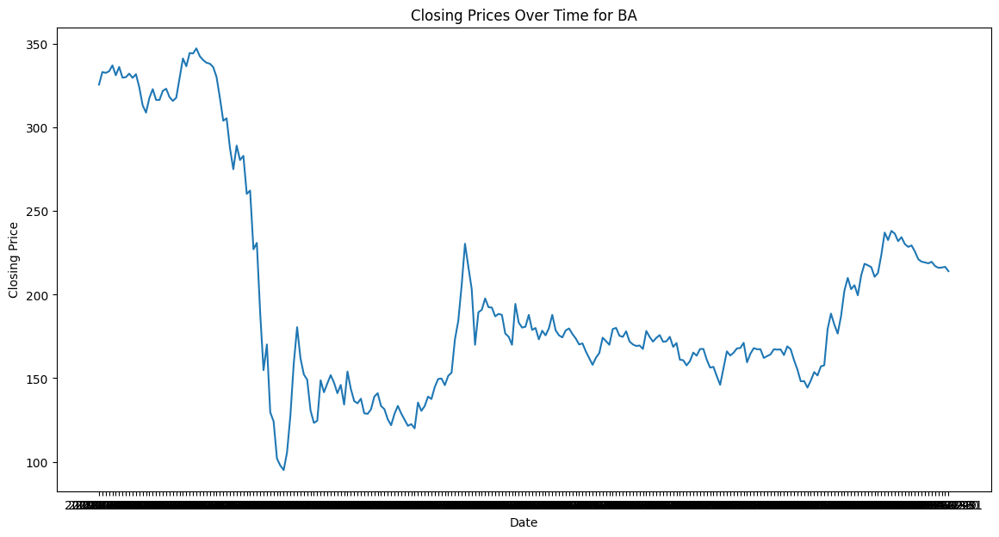

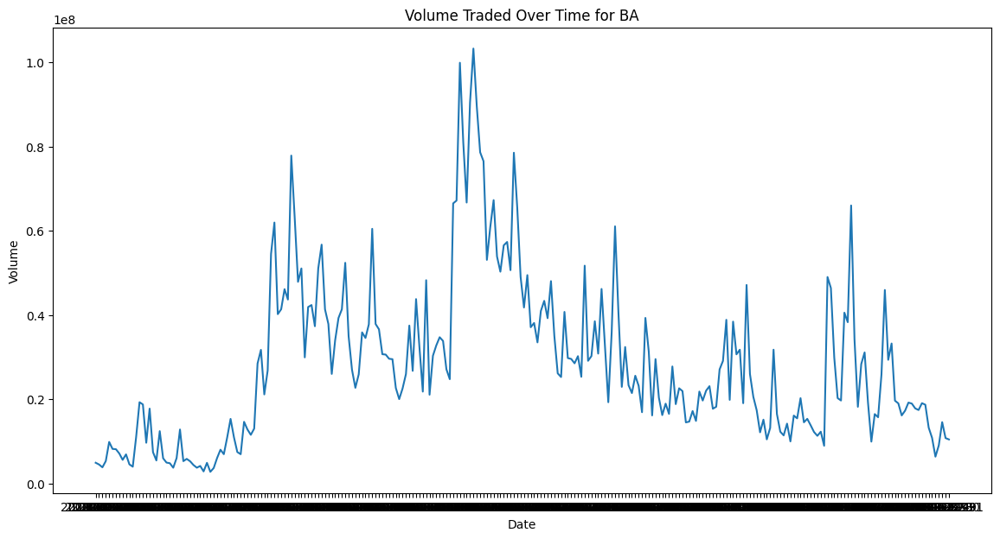

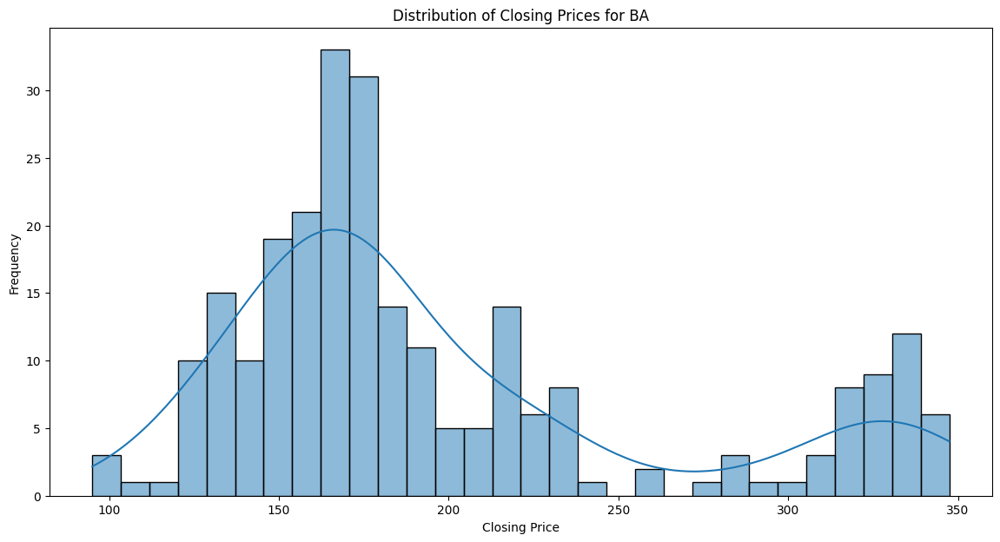

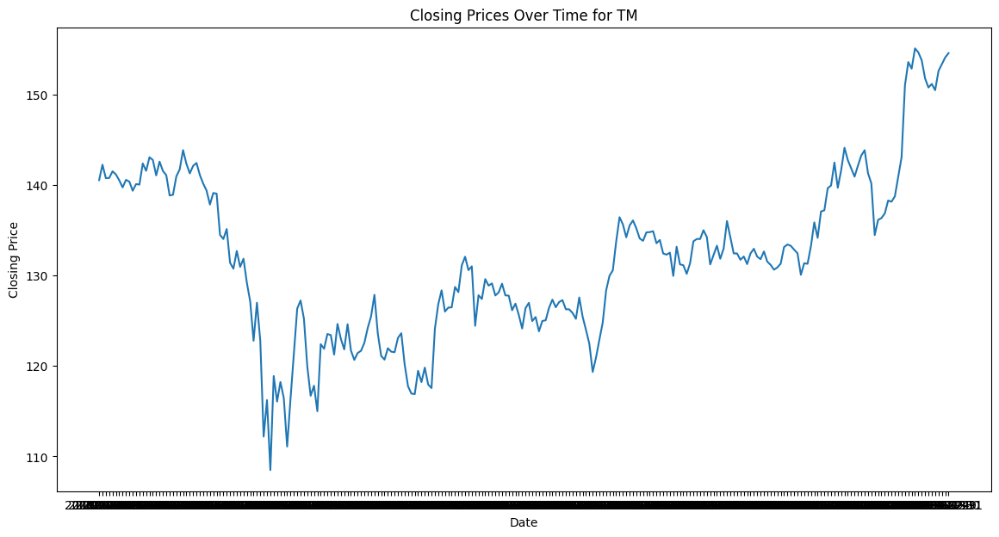

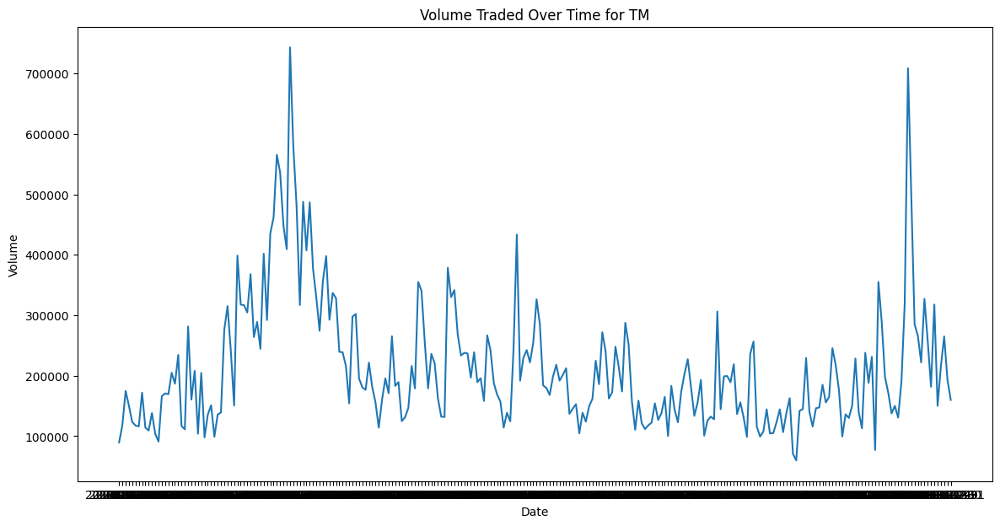

...

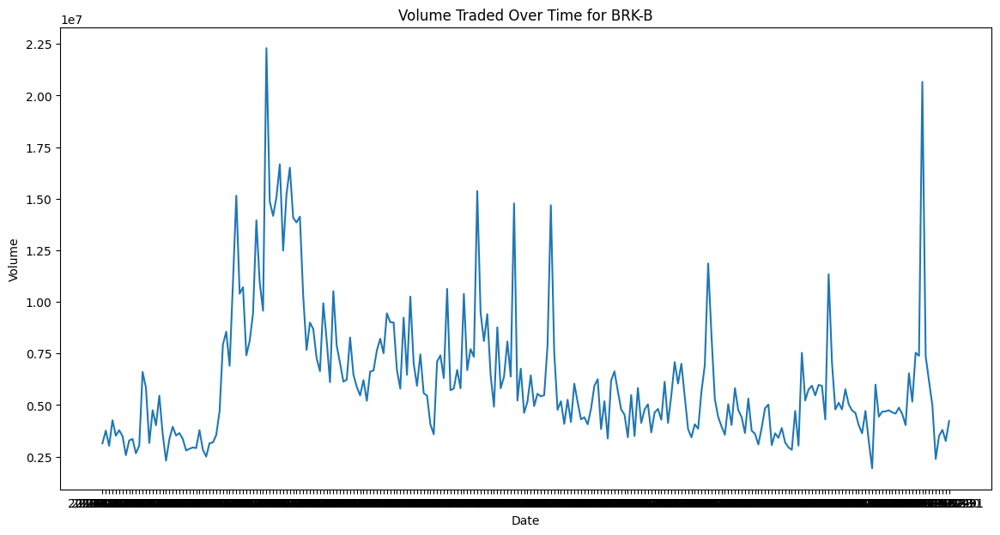

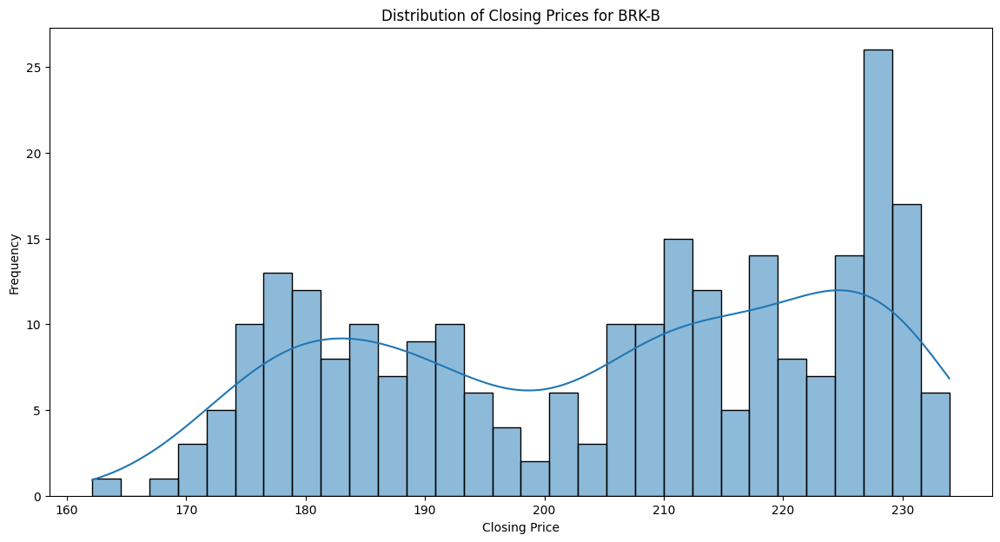

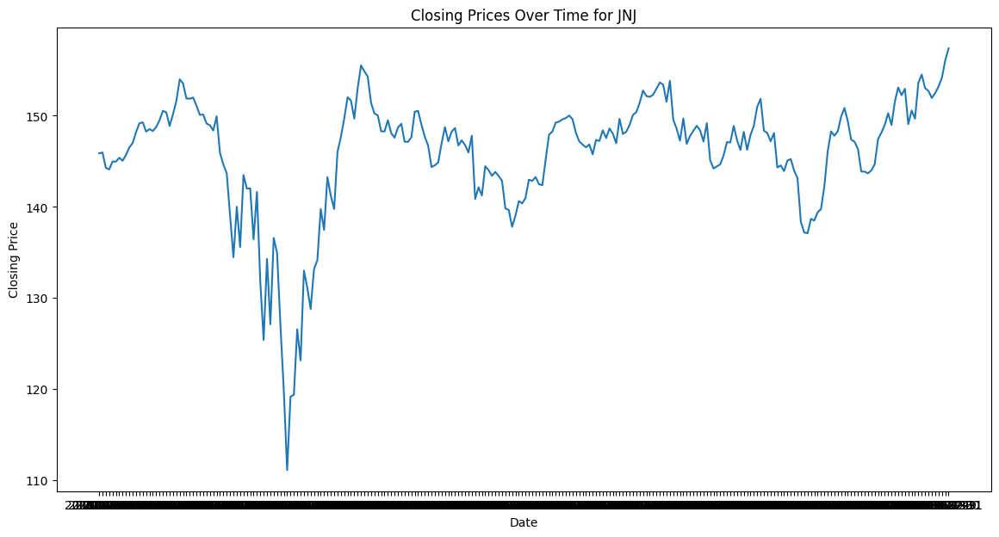

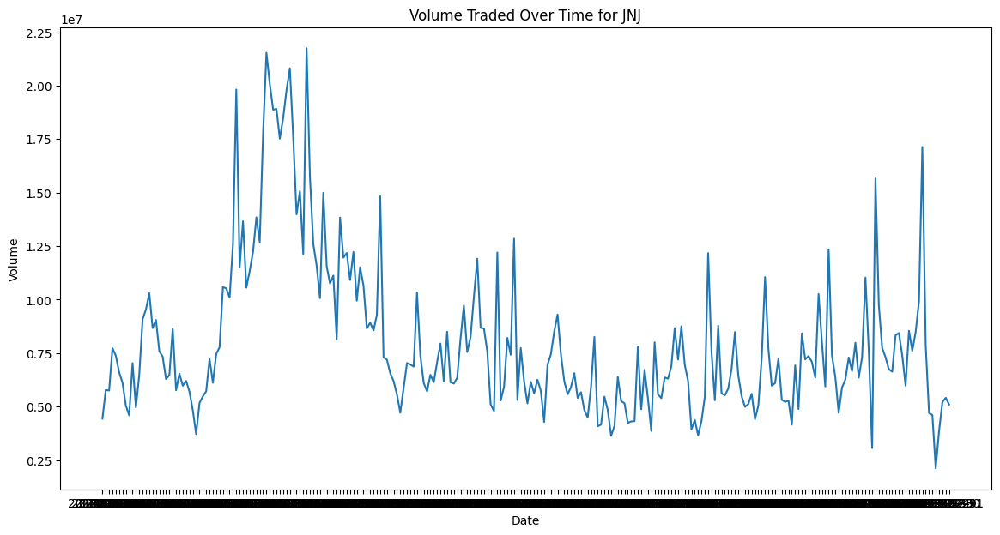

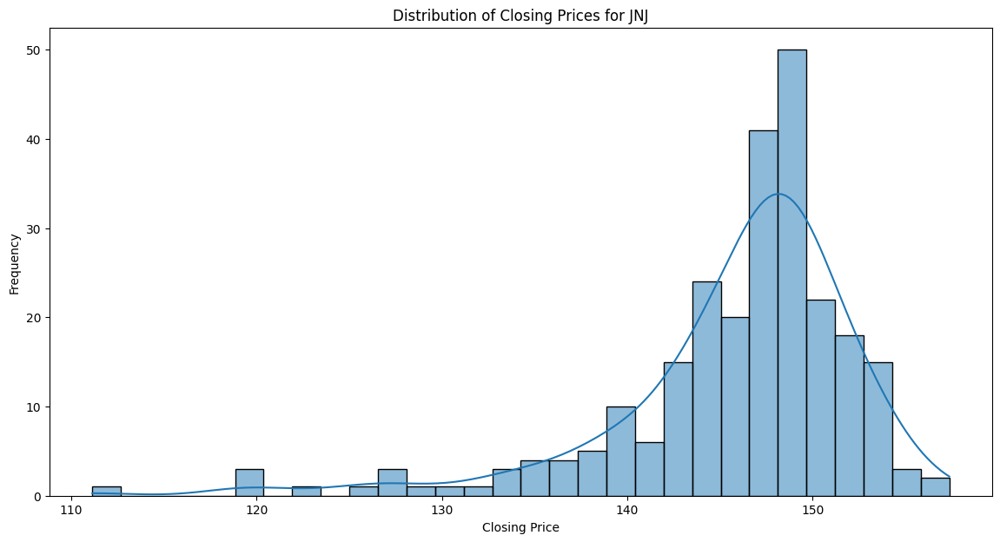

In [17]:

# Extract unique tickers
tickers = stocks_df['ticker'].unique()

# Loop through each ticker and generate plots
for ticker in tickers:
    ticker_df = stocks_df[stocks_df['ticker'] == ticker]
    
    # Plot the closing prices over time
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=ticker_df, x='date', y='close')
    plt.title(f'Closing Prices Over Time for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Closing Price')
    plt.show()

    # Plot the volume traded over time
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=ticker_df, x='date', y='volume')
    plt.title(f'Volume Traded Over Time for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.show()

    # Plot the distribution of closing prices
    plt.figure(figsize=(14, 7))
    sns.histplot(data=ticker_df, x='close', kde=True, bins=30)
    plt.title(f'Distribution of Closing Prices for {ticker}')
    plt.xlabel('Closing Price')
    plt.ylabel('Frequency')
    plt.show()

In [42]:
merged_df.head()

,date,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA,NaN,NaN,NaN,3,4,NaN
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA,NaN,NaN,NaN,3,4,NaN
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA,NaN,NaN,NaN,3,4,NaN
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA,NaN,NaN,NaN,3,4,NaN
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,2.0,$BA Stocks usually look bearish until they do...,0.6249,2,2,0.64698


## EDA

### Looking for correlations and dependencies in the data

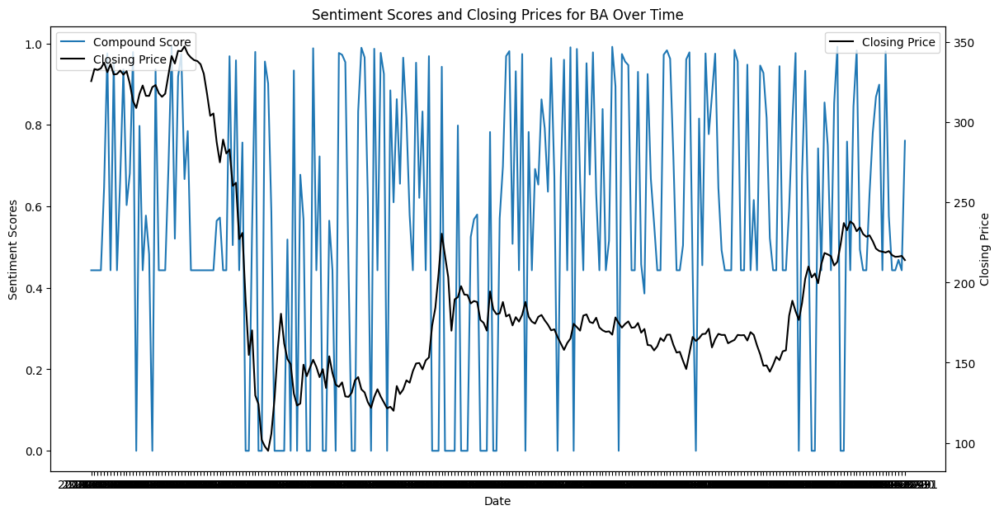

In [53]:
# Filter the DataFrame for ticker 'BA'
ba_df = merged_df[merged_df['ticker'] == 'BA']

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot sentiment scores on the primary y-axis
# sns.lineplot(data=ba_df, x='date', y='vader_label', label='Vader Sentiment', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='bert_score', label='BERT Score', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='v_comp', label='Vader Score', ax=ax1)

# Create a secondary y-axis
ax2 = ax1.twinx()

# Plot closing prices on the secondary y-axis
sns.lineplot(data=ba_df, x='date', y='close', label='Closing Price', ax=ax2, color='black')

# Set titles and labels
ax1.set_title('Sentiment Scores and Closing Prices for BA Over Time')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Scores')
ax2.set_ylabel('Closing Price')

# Combine legends from both y-axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.show()

In [228]:
# Display the DataFrame
print("Original DataFrame:")
merged_df.head(10)

Original DataFrame:


,date,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA,4.5,NaN,NaN,3.0,4.0,0.443117
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA,4.5,NaN,NaN,3.0,4.0,0.443117
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA,4.5,NaN,NaN,3.0,4.0,0.443117
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA,4.5,NaN,NaN,3.0,4.0,0.443117
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,2.0,$BA Stocks usually look bearish until they do...,0.6249,2.0,2.0,0.646980
5,2020-01-08,332.399994,334.029999,329.600006,331.369995,329.410095,8239200,BA,1.0,$BA Of course there were technical problems be...,-0.7177,0.0,1.0,0.975485
6,2020-01-09,334.950012,341.730011,332.049988,336.339996,334.350708,8175600,BA,4.5,NaN,NaN,3.0,4.0,0.443117
7,2020-01-10,335.559998,337.700012,329.450012,329.920013,327.968689,7161700,BA,6.0,$BA BOEING is a bear proof stock. 😂 $BA new CE...,0.6155,2.0,1.0,0.954755
8,2020-01-13,332.399994,334.100006,330.079987,330.220001,328.266907,5648500,BA,4.5,NaN,NaN,3.0,4.0,0.443117
9,2020-01-14,330.760010,335.350006,328.279999,332.350006,330.384308,6945300,BA,3.0,$BA designed by 🤡 supervised by 🐒’s... I’m a B...,-0.2810,0.0,2.0,0.664557


In [230]:
# Smooth the time series using a moving average
window_size = 7
merged_df['smoothed_close'] = merged_df['close'].rolling(window=window_size).mean()

# Calculate day-over-day percentage change
merged_df['day_over_day_change'] = merged_df['close'].pct_change() * 100

# Display the smoothed time series and day-over-day changes
print("\nDataFrame with Smoothed Time Series and Day-Over-Day Changes:")
merged_df.head(10)


DataFrame with Smoothed Time Series and Day-Over-Day Changes:


,date,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score,smoothed_close,day_over_day_change
0,2019-12-31,325.410004,326.570007,323.320007,325.760010,323.833313,4958800,BA,4.5,NaN,NaN,3.0,4.0,0.443117,NaN,NaN
1,2020-01-02,328.549988,333.350006,327.700012,333.320007,331.348572,4544400,BA,4.5,NaN,NaN,3.0,4.0,0.443117,NaN,2.320726
2,2020-01-03,330.630005,334.890015,330.299988,332.760010,330.791901,3875900,BA,4.5,NaN,NaN,3.0,4.0,0.443117,NaN,-0.168006
3,2020-01-06,329.299988,334.859985,327.880005,333.739990,331.766083,5355000,BA,4.5,NaN,NaN,3.0,4.0,0.443117,NaN,0.294501
4,2020-01-07,334.260010,344.190002,330.709991,337.279999,335.285156,9898600,BA,2.0,$BA Stocks usually look bearish until they do...,0.6249,2.0,2.0,0.646980,NaN,1.060709
5,2020-01-08,332.399994,334.029999,329.600006,331.369995,329.410095,8239200,BA,1.0,$BA Of course there were technical problems be...,-0.7177,0.0,1.0,0.975485,NaN,-1.752254
6,2020-01-09,334.950012,341.730011,332.049988,336.339996,334.350708,8175600,BA,4.5,NaN,NaN,3.0,4.0,0.443117,332.938572,1.499834
7,2020-01-10,335.559998,337.700012,329.450012,329.920013,327.968689,7161700,BA,6.0,$BA BOEING is a bear proof stock. 😂 $BA new CE...,0.6155,2.0,1.0,0.954755,333.532859,-1.908778
8,2020-01-13,332.399994,334.100006,330.079987,330.220001,328.266907,5648500,BA,4.5,NaN,NaN,3.0,4.0,0.443117,333.090001,0.090927
9,2020-01-14,330.760010,335.350006,328.279999,332.350006,330.384308,6945300,BA,3.0,$BA designed by 🤡 supervised by 🐒’s... I’m a B...,-0.2810,0.0,2.0,0.664557,333.031429,0.645026


matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings s

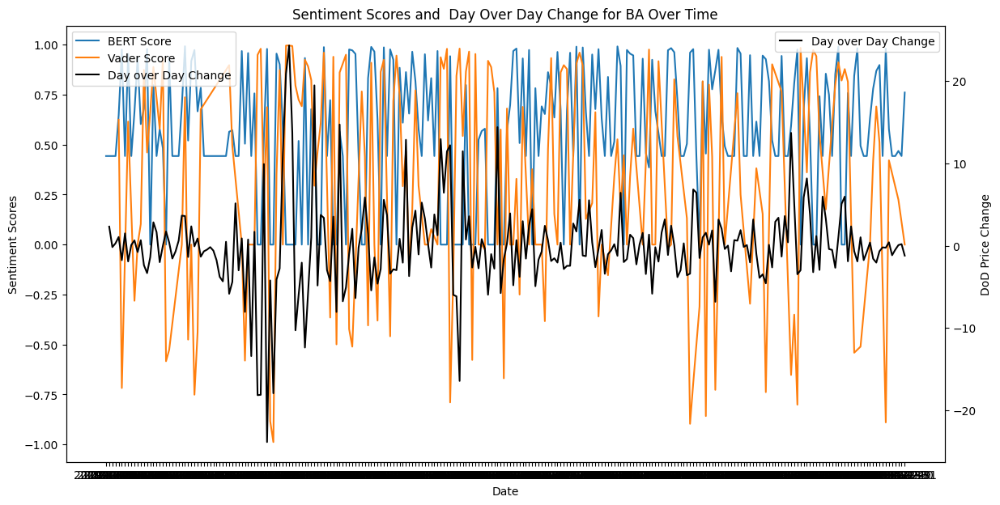

In [238]:
# Filter the DataFrame for ticker 'BA'
ba_df = merged_df[merged_df['ticker'] == 'BA']

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot sentiment scores on the primary y-axis
# sns.lineplot(data=ba_df, x='date', y='vader_label', label='Vader Sentiment', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='bert_score', label='BERT Score', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='v_comp', label='Vader Score', ax=ax1)

# Create a secondary y-axis
ax2 = ax1.twinx()

# Plot closing prices on the secondary y-axis
sns.lineplot(data=ba_df, x='date', y='day_over_day_change', label='Day over Day Change', ax=ax2, color='black')

# Set titles and labels
ax1.set_title('Sentiment Scores and  Day Over Day Change for BA Over Time')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Scores')
ax2.set_ylabel('DoD Price Change')

# Combine legends from both y-axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.show()

In [232]:
ba_df.columns

Index(['date', 'open', 'high', 'low', 'close', 'adj_close', 'volume', 'ticker',
       'num_tweets', 'concatenated_tweets', 'v_comp', 'vader_label',
       'bert_label', 'bert_score', 'smoothed_close', 'day_over_day_change'],
      dtype='object')

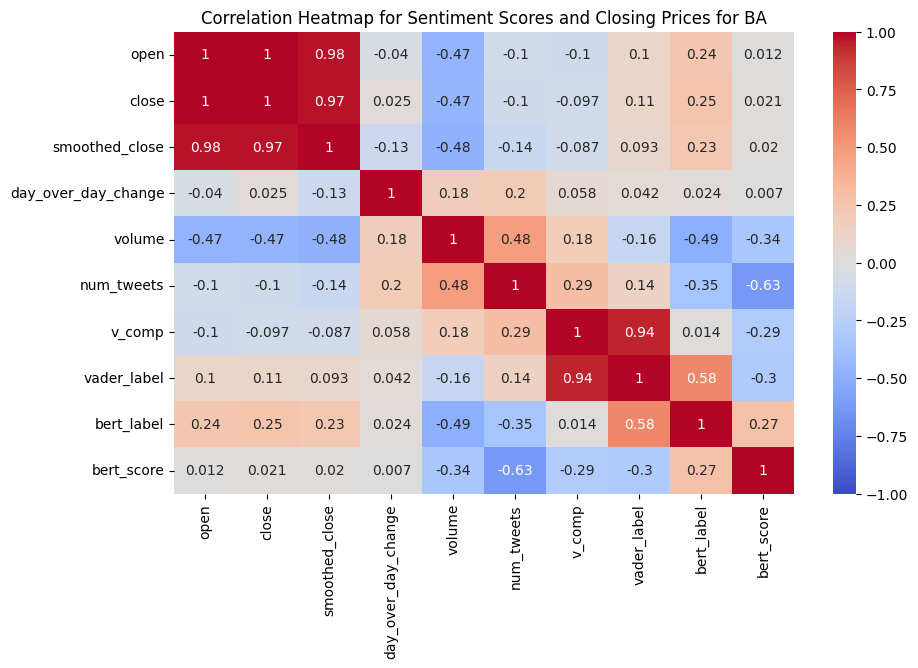

In [233]:
# Select relevant columns for the heatmap
heatmap_data = ba_df[['open', 'close', 'smoothed_close', 'day_over_day_change', 'volume', 'num_tweets',  'v_comp', 'vader_label', 'bert_label', 'bert_score']]

# Create a correlation matrix
corr_matrix = heatmap_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap for Sentiment Scores and Closing Prices for BA')
plt.show()

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


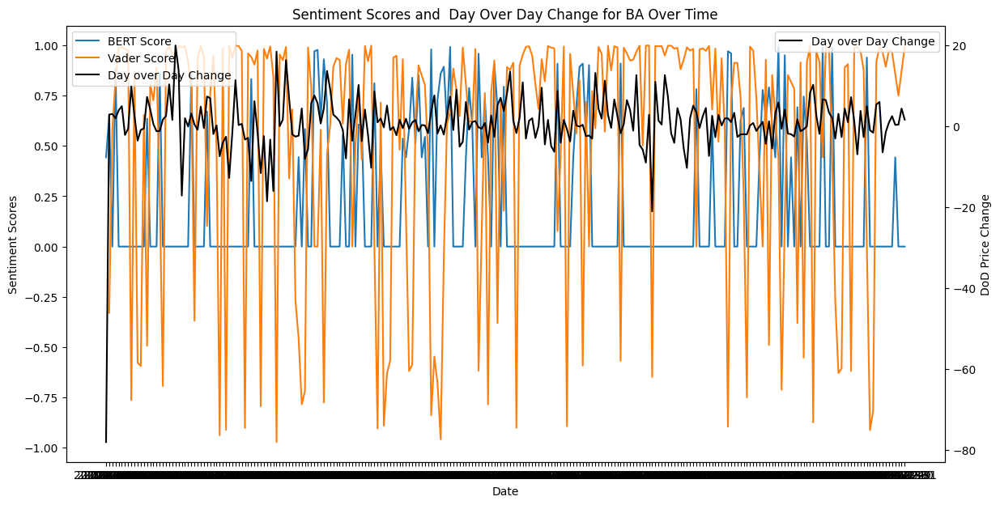

In [239]:
# Filter the DataFrame for ticker 'BA'
ba_df = merged_df[merged_df['ticker'] == 'TSLA']

# Create a figure and a set of subplots
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot sentiment scores on the primary y-axis
# sns.lineplot(data=ba_df, x='date', y='vader_label', label='Vader Sentiment', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='bert_score', label='BERT Score', ax=ax1)
sns.lineplot(data=ba_df, x='date', y='v_comp', label='Vader Score', ax=ax1)

# Create a secondary y-axis
ax2 = ax1.twinx()

# Plot closing prices on the secondary y-axis
sns.lineplot(data=ba_df, x='date', y='day_over_day_change', label='Day over Day Change', ax=ax2, color='black')

# Set titles and labels
ax1.set_title('Sentiment Scores and  Day Over Day Change for BA Over Time')
ax1.set_xlabel('Date')
ax1.set_ylabel('Sentiment Scores')
ax2.set_ylabel('DoD Price Change')

# Combine legends from both y-axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.show()

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings s

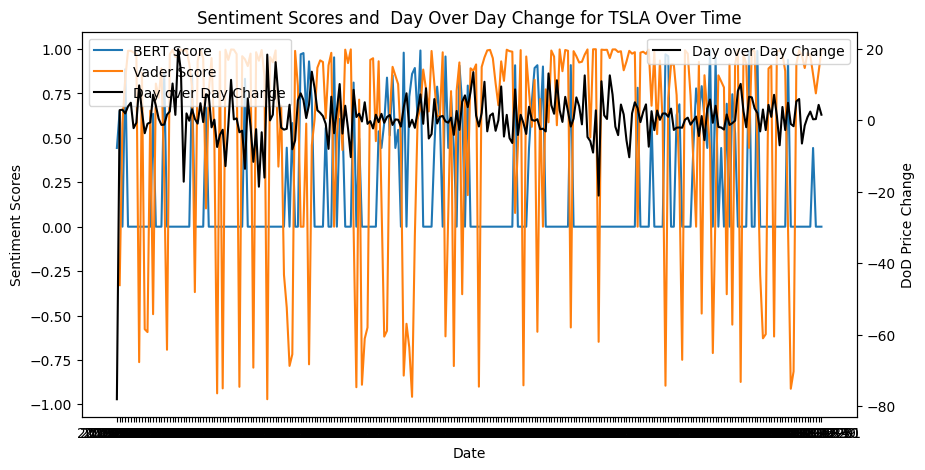

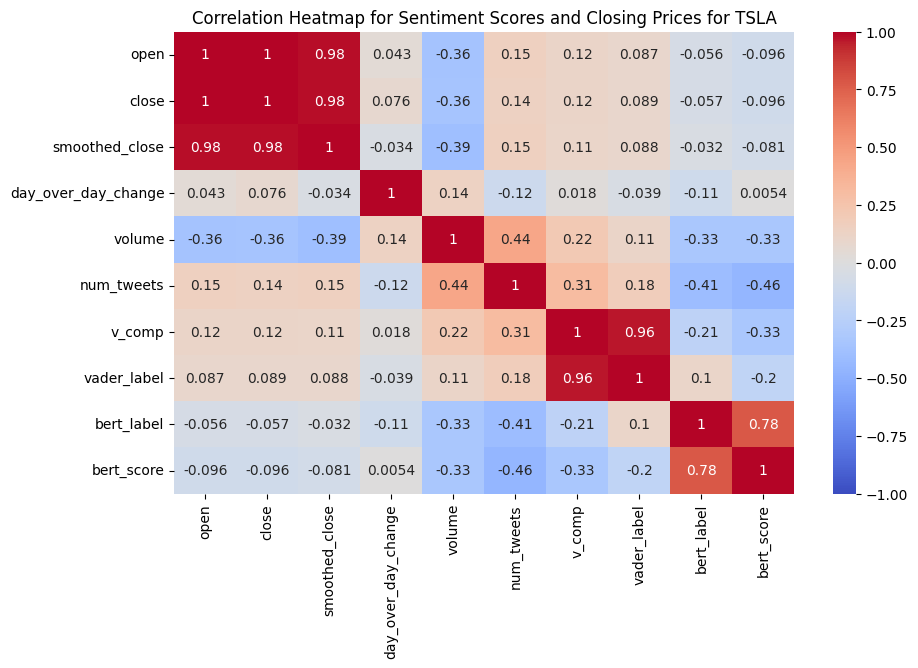

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings s

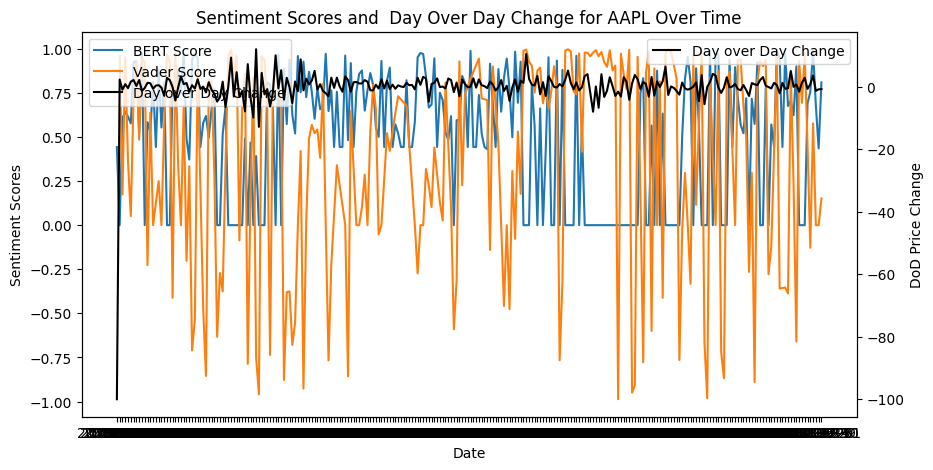

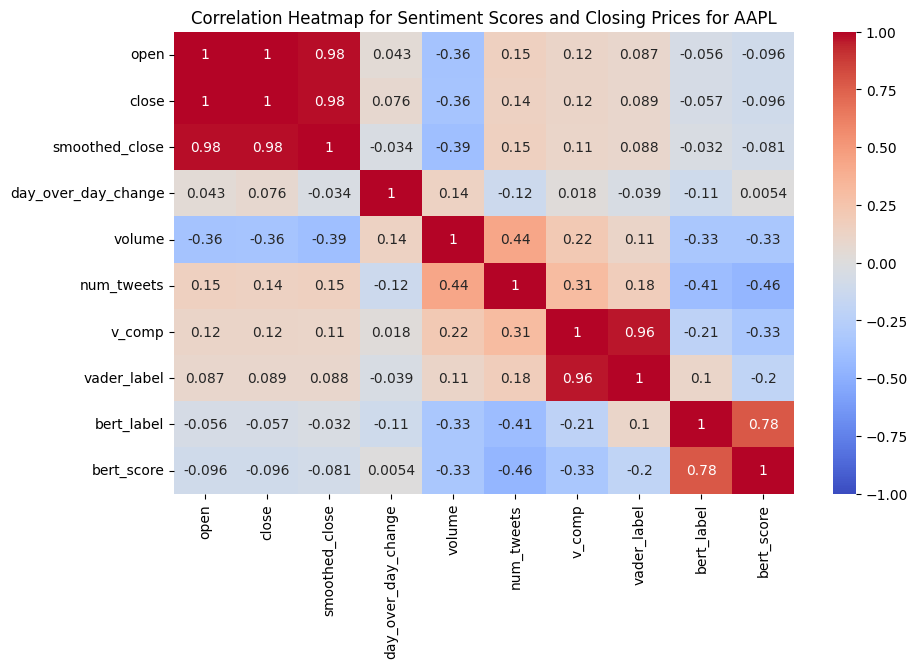

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings s

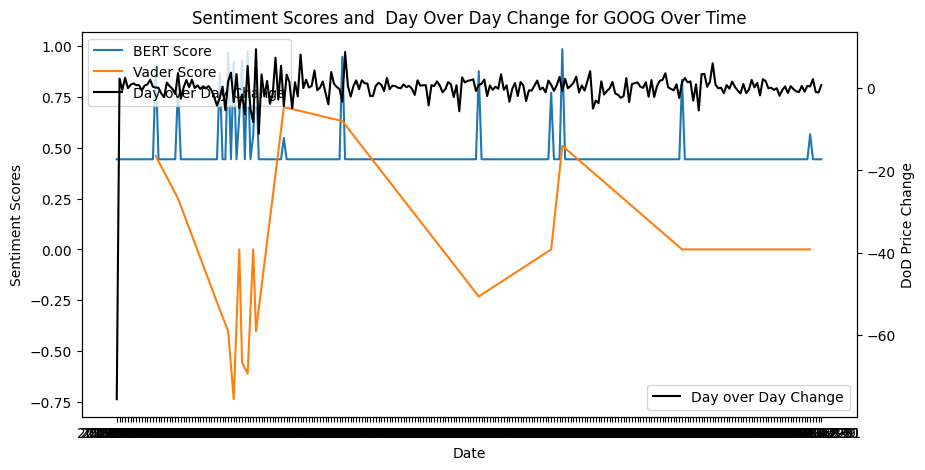

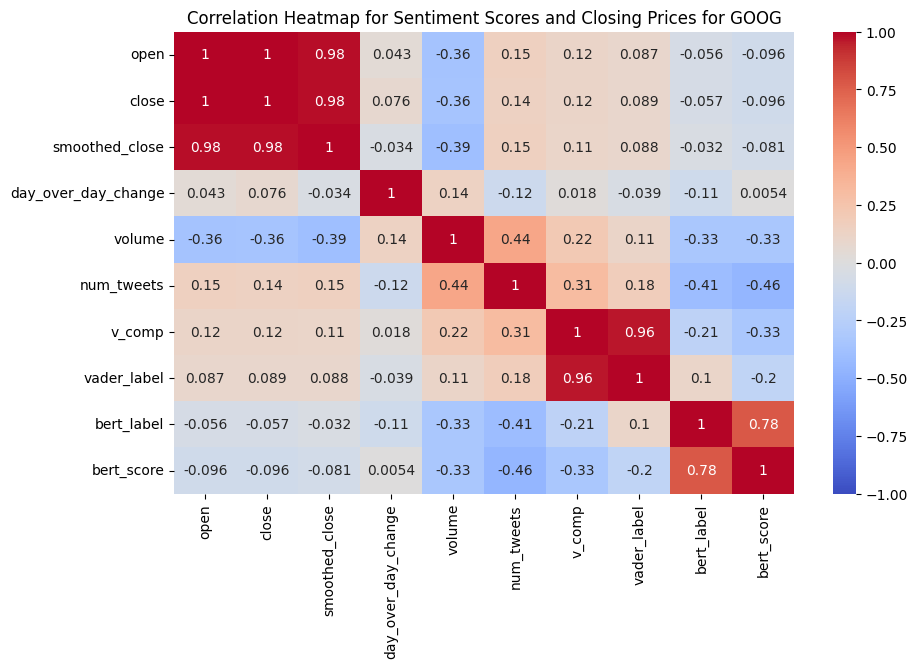

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings s

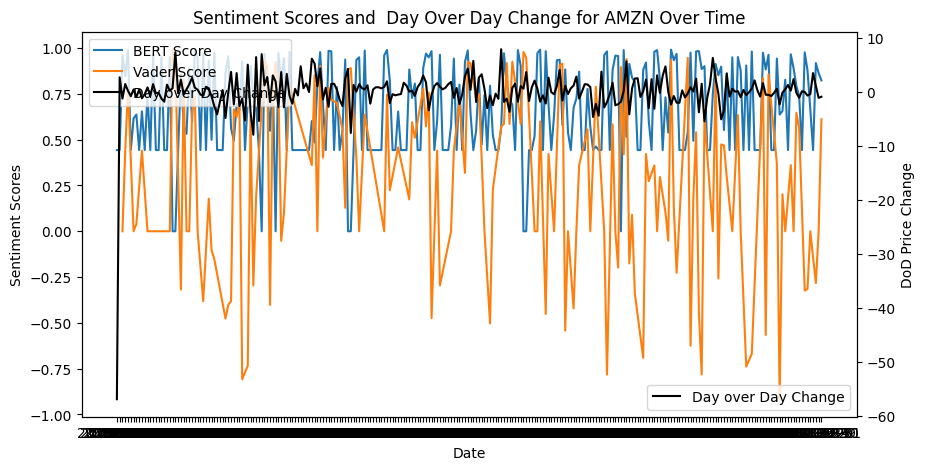

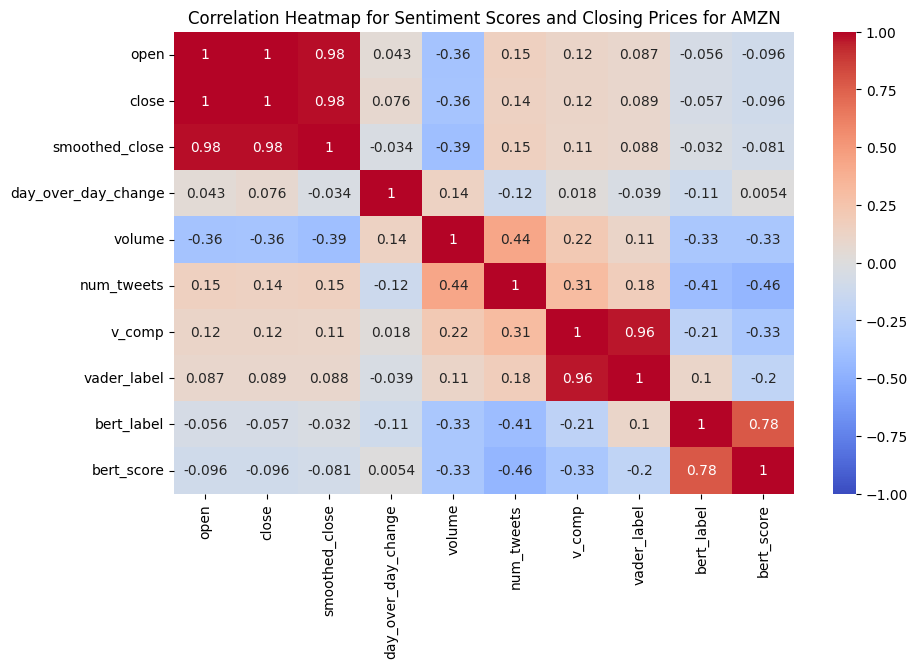

matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
matplotlib.category INFO  Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings s

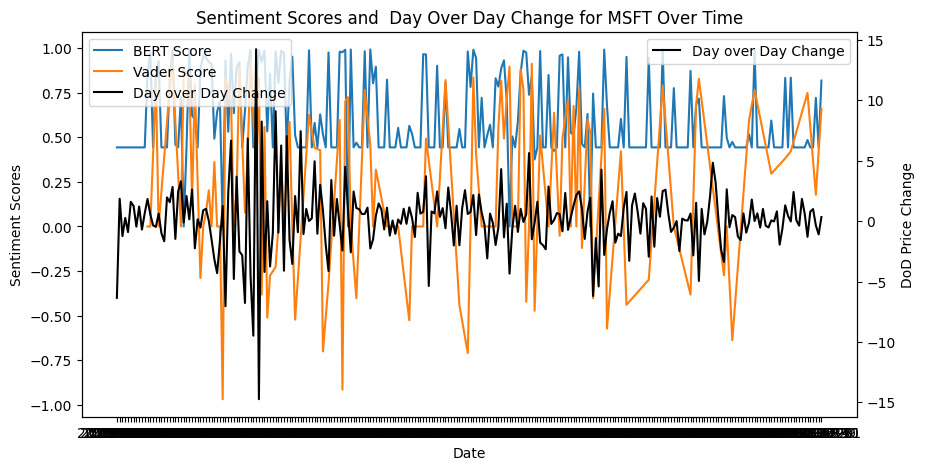

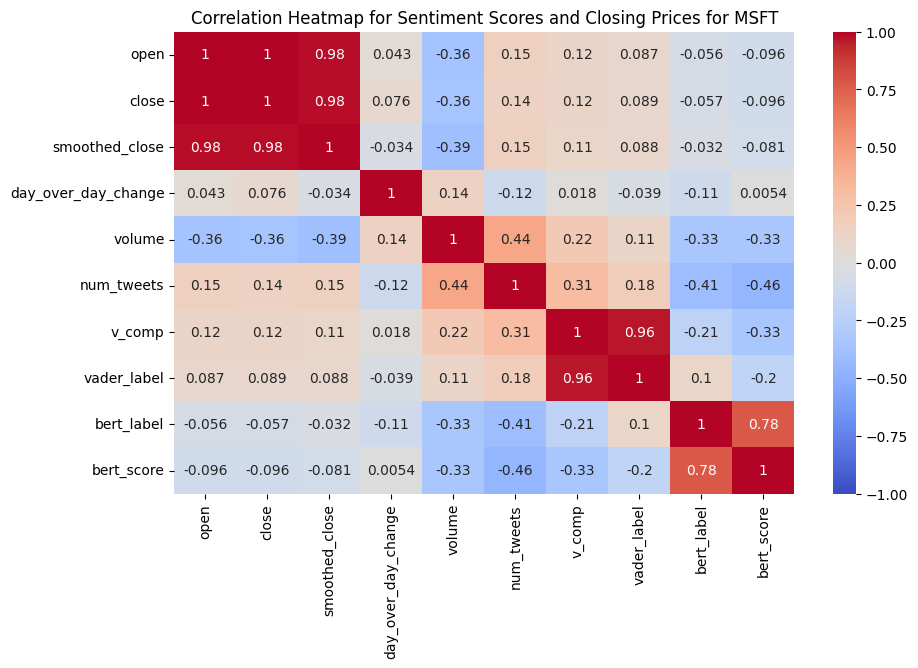

In [243]:
# List of tickers to plot
tickers = ['TSLA', 'AAPL', 'GOOG', 'AMZN', 'MSFT']

for ticker in tickers:
    # Filter the DataFrame for ticker 'BA'
    ba_df = merged_df[merged_df['ticker'] == ticker]

    # Create a figure and a set of subplots
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Plot sentiment scores on the primary y-axis
    # sns.lineplot(data=ba_df, x='date', y='vader_label', label='Vader Sentiment', ax=ax1)
    sns.lineplot(data=ba_df, x='date', y='bert_score', label='BERT Score', ax=ax1)
    sns.lineplot(data=ba_df, x='date', y='v_comp', label='Vader Score', ax=ax1)

    # Create a secondary y-axis
    ax2 = ax1.twinx()

    # Plot closing prices on the secondary y-axis
    sns.lineplot(data=ba_df, x='date', y='day_over_day_change', label='Day over Day Change', ax=ax2, color='black')

    # Set titles and labels
    ax1.set_title(f'Sentiment Scores and  Day Over Day Change for {ticker} Over Time')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Sentiment Scores')
    ax2.set_ylabel('DoD Price Change')

    # Combine legends from both y-axes
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

    plt.show()

    # Create heatmap for sentiment scores and closing prices
    heatmap_data = ticker_df[['open', 'close', 'smoothed_close', 'day_over_day_change', 'volume', 'num_tweets',  'v_comp', 'vader_label', 'bert_label', 'bert_score']]
    corr_matrix = heatmap_data.corr()
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title(f'Correlation Heatmap for Sentiment Scores and Closing Prices for {ticker}')
    plt.show()

In [60]:
merged_df.to_csv('data/processed_df.csv', index=False)


## Time Series Analysis

### Stationary vs Nonstationary data for time series analysis

Stationarity. A common assumption in many time series techniques is that the data are stationary. A stationary process has the property that the mean, variance and autocorrelation structure do not change over time.

Resources:
1. Concise explanation of implications: https://medium.com/@ritusantra/stationarity-in-time-series-887eb42f62a9
2. Time Series Analysis and Its Applications: With R Examples, Third Edition, by Robert H. Shumway and David S. Stoffer, Springer Verlag.
3. Time Series Analysis and Forecasting by Example, 1st Edition, by Søren Bisgaard and Murat Kulahci, John Wiley & Sons.
4. Practical Time Series Analysis: Prediction with Statistics and Machine Learning Paperback – 1 Nov. 2019
5. https://github.com/PacktPublishing/Practical-Time-Series-Analysis

In [258]:
from statsmodels.tsa.stattools import adfuller

for ticker in merged_df['ticker'].unique():
    merged_df[merged_df['ticker'] == ticker]
    result = adfuller(merged_df['close'].values)
    p_value = result[1]
    print(f'Ticker: {ticker}, p-value: {p_value}')
    if p_value < 0.05:
        print(f'The time series for {ticker} is likely stationary.')
    else:
        print(f'The time series for {ticker} is likely non-stationary.')

Ticker: BA, p-value: 1.166973069586841e-05
The time series for BA is likely stationary.
Ticker: TM, p-value: 1.166973069586841e-05
The time series for TM is likely stationary.
Ticker: V, p-value: 1.166973069586841e-05
The time series for V is likely stationary.
Ticker: BAC, p-value: 1.166973069586841e-05
The time series for BAC is likely stationary.
Ticker: LOW, p-value: 1.166973069586841e-05
The time series for LOW is likely stationary.
Ticker: BKNG, p-value: 1.166973069586841e-05
The time series for BKNG is likely stationary.
Ticker: TSM, p-value: 1.166973069586841e-05
The time series for TSM is likely stationary.
Ticker: ABNB, p-value: 1.166973069586841e-05
The time series for ABNB is likely stationary.
Ticker: SBUX, p-value: 1.166973069586841e-05
The time series for SBUX is likely stationary.
Ticker: AMT, p-value: 1.166973069586841e-05
The time series for AMT is likely stationary.
Ticker: PG, p-value: 1.166973069586841e-05
The time series for PG is likely stationary.
Ticker: MCD, p

To create an RNN (Recurrent Neural Network) to predict the closing price for the ticker TSLA, I use the TensorFlow and Keras libraries.

Epoch 1/20
7/7 [==============================] - 7s 15ms/step - loss: 0.0664
Epoch 2/20
7/7 [==============================] - 0s 39ms/step - loss: 0.0141
Epoch 3/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0115
Epoch 4/20
7/7 [==============================] - 0s 24ms/step - loss: 0.0051
Epoch 5/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0037
Epoch 6/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0024
Epoch 7/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0020
Epoch 8/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0022
Epoch 9/20
7/7 [==============================] - 0s 23ms/step - loss: 0.0020
Epoch 10/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0019
Epoch 11/20
7/7 [==============================] - 0s 27ms/step - loss: 0.0020
Epoch 12/20
7/7 [==============================] - 0s 46ms/step - loss: 0.0020
Epoch 13/20
7/7 [==============================] - 0s 15ms/st

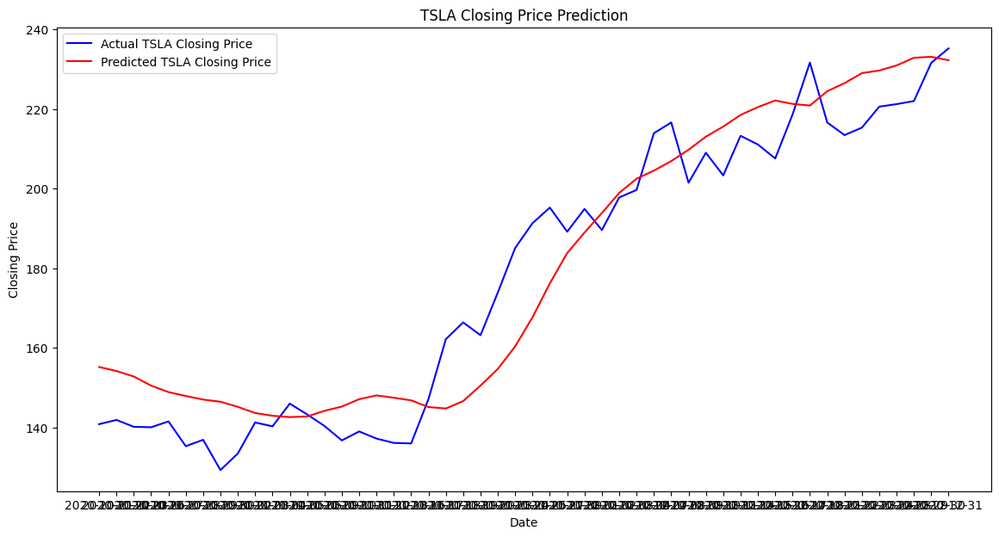

In [59]:
# Filter the DataFrame for ticker 'TSLA'
tsla_df = merged_df[merged_df['ticker'] == 'TSLA']

# Sort by date
tsla_df = tsla_df.sort_values('date')

# Use only the 'close' column for prediction
data = tsla_df[['close']].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Create sequences of data
def create_sequences(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

seq_length = 7  # Use the past 7 days to predict the next day's closing price
X, y = create_sequences(scaled_data, seq_length)

# Split the data into training and testing sets
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

# Build the RNN model
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(seq_length, 1)))
model.add(LSTM(units=50))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Make predictions
predictions = model.predict(X_test)
predictions = scaler.inverse_transform(predictions)

# Plot the results
plt.figure(figsize=(14, 7))
plt.plot(tsla_df['date'][split + seq_length:], data[split + seq_length:], color='blue', label='Actual TSLA Closing Price')
plt.plot(tsla_df['date'][split + seq_length:], predictions, color='red', label='Predicted TSLA Closing Price')
plt.title('TSLA Closing Price Prediction')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

In [60]:
import plotly.graph_objects as go

def predictions_graph(df, data, ticker, predictions, split, seq_length):
    # Create the Plotly figure
    fig = go.Figure()

    # Add the actual closing price trace
    fig.add_trace(go.Scatter(
        x=df['date'][split + seq_length:],
        y=data[split + seq_length:].flatten(),
        mode='lines',
        name='Actual {0} Closing Price'.format(ticker),
        line=dict(color='blue')
    ))

    # Add the predicted closing price trace
    fig.add_trace(go.Scatter(
        x=df['date'][split + seq_length:],
        y=predictions.flatten(),
        mode='lines',
        name='Predicted {0} Closing Price'.format(ticker),
        line=dict(color='red')
    ))

    # Update the lawet
    fig.update_layout(
        title='{0} Closing Price Prediction'.format(ticker),
        xaxis_title='Date',
        yaxis_title='Closing Price',
        legend=dict(x=0, y=1)
    )

    # Show the figure
    fig.show()

predictions_graph(tsla_df, data, "TSLA", predictions, split, seq_length)

#### Creating generalizations
Based on the function created below, we can now break it apart into multiple steps and use it for training other tickers

In [186]:
def train_rnn(X_train, y_train, seq_length=7, epochs=20, batch_size=32):

    # Build the RNN model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(seq_length, 1)))
    model.add(LSTM(units=50))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(X_train, y_train, epochs=20, batch_size=32)

    return model


In [187]:
# filter out and process the data
seq_length = 7
data, labels = mlutils.prep_ticker_data('BA', merged_df)
X_train, X_test, y_train, y_test, scaler, split = mlutils.scale_and_split(labels, seq_length)

# train the model and make predictions on test dataset
model = train_rnn(X_train, y_train, seq_length)
predictions = model.predict(X_test)
predictions = scaler.inverse_transform(predictions)

# graph the prediction
predictions_graph(data, labels, "BA", predictions, split, seq_length)



Epoch 1/20
7/7 [==============================] - 17s 35ms/step - loss: 0.1677
Epoch 2/20
7/7 [==============================] - 1s 39ms/step - loss: 0.0415
Epoch 3/20
7/7 [==============================] - 0s 33ms/step - loss: 0.0263
Epoch 4/20
7/7 [==============================] - 1s 77ms/step - loss: 0.0148
Epoch 5/20
7/7 [==============================] - 0s 21ms/step - loss: 0.0145
Epoch 6/20
7/7 [==============================] - 0s 25ms/step - loss: 0.0095
Epoch 7/20
7/7 [==============================] - 0s 71ms/step - loss: 0.0092
Epoch 8/20
7/7 [==============================] - 0s 58ms/step - loss: 0.0067
Epoch 9/20
7/7 [==============================] - 0s 28ms/step - loss: 0.0071
Epoch 10/20
7/7 [==============================] - 0s 24ms/step - loss: 0.0068
Epoch 11/20
7/7 [==============================] - 0s 29ms/step - loss: 0.0067
Epoch 12/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0067
Epoch 13/20
7/7 [==============================] - 0s 51ms/s

In [169]:
seq_length = 3
data, labels = mlutils.prep_ticker_data('BA', merged_df)
X_train, X_test, y_train, y_test, scaler, split = mlutils.scale_and_split(labels, seq_length)

# train the model and make predictions on test dataset
model = train_rnn(X_train, y_train, seq_length)
predictions = model.predict(X_test)
predictions = scaler.inverse_transform(predictions)

# graph the prediction
predictions_graph(data, labels, "BA", predictions, split, seq_length)


Epoch 1/20
7/7 [==============================] - 31s 23ms/step - loss: 0.0833
Epoch 2/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0481
Epoch 3/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0219
Epoch 4/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0160
Epoch 5/20
7/7 [==============================] - 0s 42ms/step - loss: 0.0143
Epoch 6/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0089
Epoch 7/20
7/7 [==============================] - 0s 21ms/step - loss: 0.0070
Epoch 8/20
7/7 [==============================] - 0s 45ms/step - loss: 0.0035
Epoch 9/20
7/7 [==============================] - 0s 21ms/step - loss: 0.0022
Epoch 10/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0014
Epoch 11/20
7/7 [==============================] - 0s 70ms/step - loss: 0.0013
Epoch 12/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0015
Epoch 13/20
7/7 [==============================] - 0s 27ms/s

## Recursive autoregressive forecasting

Recursive autoregressive forecasting is a technique used in time series forecasting where predictions are made one step at a time, and each prediction is fed back into the model as an input for making subsequent predictions. This approach is particularly useful when we need to forecast multiple steps ahead into the future.

Initial Prediction: The model is trained on historical data and makes a prediction for the next time step.
Feedback Loop: The predicted value is then added to the input data, and the model uses this updated input to make the next prediction.
Repeat: This process is repeated recursively for as many steps ahead as needed.
Example: Let's say we have a time series of daily temperatures and we want to forecast the temperature for the next 7 days. Using recursive autoregressive forecasting, we would:

Train our model on the historical temperature data.
Predict the temperature for day 1.
Use the predicted temperature for day 1 as part of the input to predict the temperature for day 2.
Continue this process until we have predictions for all 7 days.
Advantages
Simplicity: Easy to implement and understand.
Flexibility: Can be used with various types of models, including linear regression, ARIMA, and neural networks.
Disadvantages
Error Propagation: Errors can accumulate over multiple steps, leading to less accurate long-term forecasts.
Computationally Intensive: Requires multiple iterations, which can be computationally expensive.

In [89]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor

from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregCustom import ForecasterAutoregCustom
from skforecast.model_selection import grid_search_forecaster


In [102]:
tsla_df = merged_df[merged_df['ticker'] == 'TSLA']
tsla_df = tsla_df.sort_values('date')

tsla_df['date'] = pd.to_datetime(tsla_df['date'])

data = tsla_df.set_index('date')
data = data.asfreq('D')
data = data.sort_index()
data.tail()

,open,high,low,close,adj_close,volume,ticker,num_tweets,concatenated_tweets,v_comp,vader_label,bert_label,bert_score
date,,,,,,,,,,,,,
2020-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-28,224.836670,227.133331,220.266663,221.229996,221.229996,96835800.0,TSLA,4.5,NaN,NaN,3.0,4.0,0.443117
2020-12-29,220.333328,223.300003,218.333328,221.996674,221.996674,68732400.0,TSLA,10.0,$TSLA at the office my computer says Tesla\nIs...,0.7505,2.0,0.0,0.000000
2020-12-30,224.000000,232.199997,222.786667,231.593338,231.593338,128538000.0,TSLA,14.0,$TSLA does anyone else smell burning shorts 🩳 ...,0.8711,2.0,0.0,0.000000
2020-12-31,233.330002,239.573334,230.373337,235.223328,235.223328,148949700.0,TSLA,23.0,$TSLA Tesla sitting at 695 AH’s like 👍 $TSLA b...,0.9925,2.0,0.0,0.000000


We can see that changing the frequency created gaps over the weekend, and the missing valkues will now be throwing errors. To impute missing values by copying from the previous cell in a Pandas DataFrame, we can use the fillna method with the method='ffill' parameter. This method is known as forward fill and it propagates the last valid observation forward to the next valid observation.

In [107]:
data = data.fillna(method='ffill')

/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/ipykernel_19665/917065080.py:1: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Train dates : 2019-12-31 00:00:00 --- 2020-12-17 00:00:00  (n=353)
Test dates  : 2020-12-18 00:00:00 --- 2020-12-31 00:00:00  (n=14)


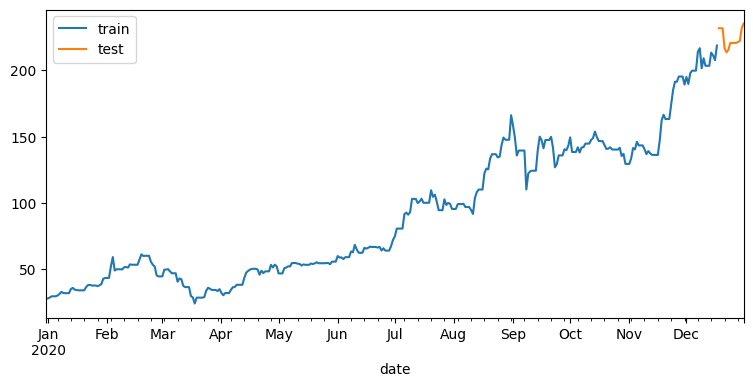

In [149]:
steps = 14

data_train = data[:-steps]
data_test  = data[-steps:]

print(f"Train dates : {data_train.index.min()} --- {data_train.index.max()}  (n={len(data_train)})")
print(f"Test dates  : {data_test.index.min()} --- {data_test.index.max()}  (n={len(data_test)})")

fig, ax=plt.subplots(figsize=(9, 4))
data_train['close'].plot(ax=ax, label='train')
data_test['close'].plot(ax=ax, label='test')
ax.legend();

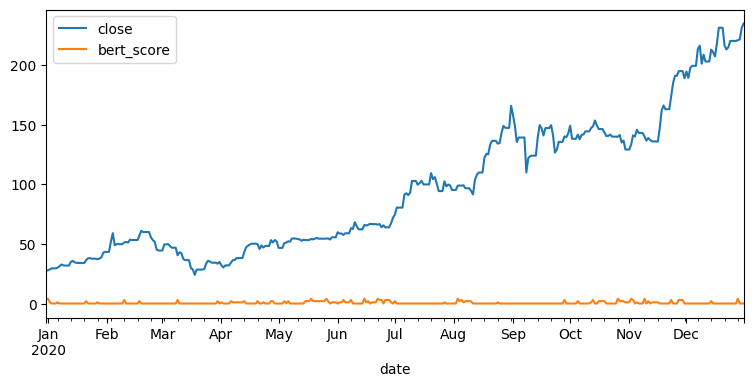

In [150]:
fig, ax = plt.subplots(figsize=(9, 4))
data['close'].plot(ax=ax, label='close')
data['bert_label'].plot(ax=ax, label='bert_score')
ax.legend();

In [151]:
# Create and train forecaster
# ==============================================================================
forecaster = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123),
                lags      = 8
             )

forecaster.fit(y=data_train['close'], exog=data_train[['open', 'bert_score', 'bert_label', 'num_tweets']])
forecaster

ForecasterAutoreg 
Regressor: RandomForestRegressor(random_state=123) 
Lags: [1 2 3 4 5 6 7 8] 
Transformer for y: None 
Transformer for exog: None 
Window size: 8 
Weight function included: False 
Differentiation order: None 
Exogenous included: True 
Exogenous variables names: ['open', 'bert_score', 'bert_label', 'num_tweets'] 
Training range: [Timestamp('2019-12-31 00:00:00'), Timestamp('2020-12-17 00:00:00')] 
Training index type: DatetimeIndex 
Training index frequency: D 
Regressor parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 123, 'verbose': 0, 'warm_start': False} 
fit_kwargs: {} 
Creation date: 2024-10-20 18:20:44 
Last fit date: 2024-10-20 18:20:45 
Skforec

In [152]:
predictions = forecaster.predict(steps=steps, exog=data_test[['open', 'bert_score', 'bert_label', 'num_tweets']])

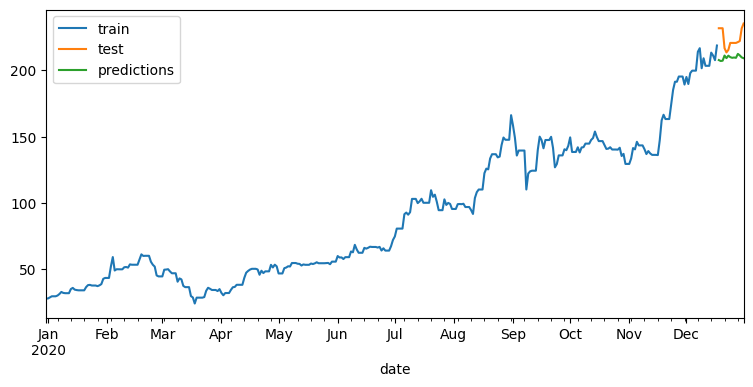

In [153]:
# Plot
# ==============================================================================
fig, ax = plt.subplots(figsize=(9, 4))
data_train['close'].plot(ax=ax, label='train')
data_test['close'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

In [128]:
# Hyperparameter Grid search
# ==============================================================================
steps = 7
forecaster = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123),
                lags      = 12 # This value will be replaced in the grid search
             )

lags_grid = [5, 12, 20]

param_grid = {'n_estimators': [50, 100, 500],
              'max_depth': [3, 5, 10]}

results_grid = grid_search_forecaster(
                        forecaster  = forecaster,
                        y           = data_train['close'],
                        exog        = data_train['bert_label'],
                        param_grid  = param_grid,
                        lags_grid   = lags_grid,
                        steps       = steps,
                        refit       = True,
                        metric      = 'mean_squared_error',
                        initial_train_size = int(len(data_train)*0.5),
                        return_best = True,
                        verbose     = False
               )

Number of models compared: 27.


lags grid:   0%|          | 0/3 [00:00<?, ?it/s]

params grid:   0%|          | 0/9 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [1 2 3 4 5] 
  Parameters: {'max_depth': 10, 'n_estimators': 500}
  Backtesting metric: 193.45549912580356



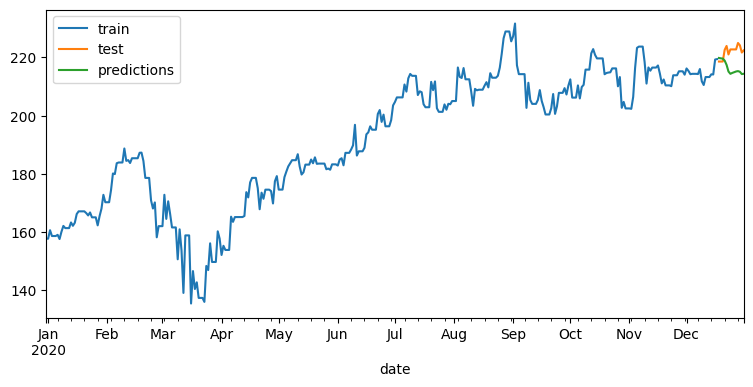

In [198]:
forecaster = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123, max_depth=10, n_estimators=500),
                lags      = 8
             )

forecaster.fit(y=data_train['close'], exog=data_train['bert_score'])
forecaster

predictions = forecaster.predict(steps=steps, exog=data_test['bert_score'])
fig, ax = plt.subplots(figsize=(9, 4))
data_train['close'].plot(ax=ax, label='train')
data_test['close'].plot(ax=ax, label='test')
predictions.plot(ax=ax, label='predictions')
ax.legend();

In [199]:
predictions

2020-12-18    219.808824
2020-12-19    219.679475
2020-12-20    219.594356
2020-12-21    218.902168
2020-12-22    217.441663
2020-12-23    215.158945
2020-12-24    214.365020
2020-12-25    214.676240
2020-12-26    214.921744
2020-12-27    215.169908
2020-12-28    215.290309
2020-12-29    215.071470
2020-12-30    214.268892
2020-12-31    214.384617
Freq: D, Name: pred, dtype: float64

In [ ]:
forecaster = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123, max_depth=10, n_estimators=500),
                lags      = 8
             )

forecaster.fit(y=data_train['close'], exog=data_train[['bert_score', 'bert_label', 'num_tweets']])
forecaster

### Create an ARIMA model
This code experiments on how to create an ARIMAX model for our merged_df DataFrame, fit the model with exogenous variables, and make predictions with confidence intervals. Adjusting the order parameter (p, d, q) was required.



In [223]:
forecast_steps = 14

In [224]:
t_df = merged_df[merged_df['ticker'] == 'TSLA']
t_df = t_df.sort_values('date')

t_df['date'] = pd.to_datetime(t_df['date'])

from statsmodels.tsa.arima.model import ARIMA

# Define the endogenous variable (target) and exogenous variables
endog = t_df['close']
exog = t_df[['volume', 'bert_score', 'num_tweets']]

# Fit the ARIMAX model
model = ARIMA(endog, order=(5, 1, 0), exog=exog)  # Adjust the order (p, d, q) as needed
model_fit = model.fit()

# Display the model summary
print(model_fit.summary())

# Make predictions
exog_forecast = exog[-forecast_steps:]  # Use the last few rows of exogenous variables for forecasting
forecast = model_fit.get_forecast(steps=forecast_steps, exog=exog_forecast)


/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



                               SARIMAX Results                                
Dep. Variable:                  close   No. Observations:                  254
Model:                 ARIMA(5, 1, 0)   Log Likelihood                -769.459
Date:                Thu, 24 Oct 2024   AIC                           1556.918
Time:                        16:43:29   BIC                           1588.718
Sample:                             0   HQIC                          1569.712
                                - 254                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
volume      1.671e-08   3.45e-09      4.838      0.000    9.94e-09    2.35e-08
bert_score     0.6098      0.001   1081.461      0.000       0.609       0.611
num_tweets    -0.0396      0.021     -1.863      0.0

/usr/local/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



In [225]:
# Display the forecast and confidence intervals
print("Forecasted values:")
yhat = forecast.predicted_mean
print(forecast.predicted_mean)

print("\nConfidence intervals:")
yhat_conf_int = forecast.conf_int(alpha=0.05)
print(yhat_conf_int)

Forecasted values:
254    235.453676
255    237.909981
256    236.842367
257    236.052926
258    236.565618
259    243.329092
260    236.298384
261    234.991066
262    234.948800
263    234.355643
264    235.557417
265    234.623513
266    235.469015
267    235.450539
Name: predicted_mean, dtype: float64

Confidence intervals:
     lower close  upper close
254   225.434449   245.472902
255   223.831457   251.988504
256   219.218436   254.466299
257   215.024695   257.081158
258   212.587819   260.543417
259   217.086028   269.572155
260   207.930622   264.666147
261   204.691175   265.290957
262   202.882723   267.014876
263   200.617091   268.094196
264   200.206974   270.907860
265   197.738728   271.508297
266   197.106763   273.831266
267   195.660793   275.240284


In [226]:
# Create a Plotly figure
fig = go.Figure()

# Create a date range for the forecast
forecast_dates = t_df['date']

# Add the actual data trace
fig.add_trace(go.Scatter(
    x=forecast_dates,
    y=t_df['close'],
    mode='lines',
    name='Actual'
))

# Add the forecast trace
fig.add_trace(go.Scatter(
    x=forecast_dates[-forecast_steps:],
    y=yhat,
    mode='lines',
    name='Forecast'
))

# Add the confidence interval traces
fig.add_trace(go.Scatter(
    x=forecast_dates[-forecast_steps:],
    y=yhat_conf_int['lower close'],
    mode='lines',
    name='Lower Confidence Interval',
    line=dict(dash='dash')
))

fig.add_trace(go.Scatter(
    x=forecast_dates[-forecast_steps:],
    y=yhat_conf_int['upper close'],
    mode='lines',
    name='Upper Confidence Interval',
    line=dict(dash='dash')
))

# Update the layout
fig.update_layout(
    title='ARIMAX Model Forecast',
    xaxis_title='Date',
    yaxis_title='Close Price',
    legend=dict(x=0, y=1)
)

# Show the figure
fig.show()

## Facebook Prophet model

In [253]:
def split_and_prep_univariate(univariate_df):
    train_size = int(0.75 * len(univariate_df))
    
    univariate_df.columns = ['ds', 'y']
    
    train = univariate_df.iloc[:train_size, :]
    
    x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
    x_valid, y_valid = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

    return train, x_train, y_train, x_valid, y_valid

In [254]:
from prophet import Prophet
from prophet.serialize import model_to_json, model_from_json
from sklearn.metrics import mean_absolute_error

In [255]:
filtered_df, _ = mlutils.prep_ticker_data('TSLA', merged_df)
train, x_train, y_train, x_valid, y_valid = split_and_prep_univariate(filtered_df[['date', 'close']])
print(train.shape, len(x_train), len(x_valid))

model = Prophet(growth="linear")
model.fit(train)
    
# Predict on valid set
y_pred = model.predict(x_valid)    
# Calcuate metrics
score_mae = mean_absolute_error(y_valid, y_pred['yhat'])
print(f"Mean Absolute Error: {score_mae}")
# Saving each model to be able to easily restore all models without re-training and re-use / port them
# with open('prophet_models/' + f'{name}.json', 'w') as fout:
#     fout.write(model_to_json(model))  # Save model


(190, 2) 190 64


prophet    INFO  Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
prophet    INFO  Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
cmdstanpy  DEBUG input tempfile: /var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/tmpbs70h18i/zxzd9ynd.json
cmdstanpy  DEBUG input tempfile: /var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/tmpbs70h18i/432hxljm.json
cmdstanpy  DEBUG idx 0
cmdstanpy  DEBUG running CmdStan, num_threads: None
cmdstanpy  DEBUG CmdStan args: ['/usr/local/lib/python3.11/site-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64133', 'data', 'file=/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/tmpbs70h18i/zxzd9ynd.json', 'init=/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/tmpbs70h18i/432hxljm.json', 'output', 'file=/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/tmpbs70h18i/prophet_model2ttjrkdr/prophet_model-20241024173527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:

Mean Absolute Error: 18.612054753617546


## Pre-Train the models

### RNNs

Below, we will prepare the data (filtering, splitting, etc) for each ticker symbol, store itinto Mongo DB (each ticker will be a separate collection with each collection containing different records base don the performed splits etc), and then train Keras model. The model will be stored into a file locally.

In [82]:
TICKERS = merged_df['ticker'].unique()
TICKERS

array(['BA', 'V', 'BAC', 'LOW', 'BKNG', 'TSM', 'ABNB', 'SBUX', 'AMT',
       'PG', 'MCD', 'AMZN', 'KO', 'PYPL', 'UPS', 'MSFT', 'CCL', 'NVDA',
       'HD', 'XOM', 'CVX', 'NKE', 'FB', 'DIS', 'NFLX', 'JPM', 'TSLA',
       'GOOGL', 'GOOG', 'PFE', 'BABA', 'UNH', 'MA', 'AAPL', 'WMT', 'JNJ'],
      dtype=object)

In [155]:
TICKERS = ['TSLA', 'AAPL', 'GOOG', 'AMZN', 'MSFT']

In [190]:
import pickle

In [197]:
for ticker in TICKERS:
    t_df = merged_df[merged_df['ticker'] == ticker]
    t_df = t_df.sort_values('date')

    t_df['date'] = pd.to_datetime(t_df['date'])

    data = t_df.set_index('date')
    data = data.asfreq('D')
    data = data.sort_index()
    data = data.fillna(method='ffill')
    
    steps = 14
    data_train = data[:-steps]
    data_test  = data[-steps:]

    forecaster = ForecasterAutoreg(
                    regressor = RandomForestRegressor(random_state=123, max_depth=10, n_estimators=500),
                    lags      = 8
                )

    forecaster.fit(y=data_train['close'], exog=data_train[['bert_score', 'bert_label', 'num_tweets']])
    with open(f'models/forecaster_autoreg/{ticker}.pkl', 'wb+') as file:
        pickle.dump(forecaster, file)
        print("Model saved successfully!")  

/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/ipykernel_19665/445333512.py:10: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Model saved successfully!


/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/ipykernel_19665/445333512.py:10: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Model saved successfully!


/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/ipykernel_19665/445333512.py:10: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Model saved successfully!


/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/ipykernel_19665/445333512.py:10: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Model saved successfully!


/var/folders/z7/8n2dlxg16tggjrtnz6s70x180000gn/T/ipykernel_19665/445333512.py:10: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Model saved successfully!


In [189]:
for ticker in TICKERS:
    for seq_length in [1, 3, 7]:
        data, labels = mlutils.prep_ticker_data(ticker, merged_df)
        X_train, X_test, y_train, y_test, scaler, split = mlutils.scale_and_split(labels, seq_length)

        # train the model and make predictions on test dataset
        model = train_rnn(X_train, y_train, seq_length)
        predictions = model.predict(X_test)
        predictions = scaler.inverse_transform(predictions)

        # graph the prediction
        predictions_graph(data, labels, ticker, predictions, split, seq_length)
   
        # Saving each model to be able to easily restore all models without re-training and re-use / port them to other systems. For example, our dashboard can use these instead of retraining 
        model.save('models/rnn/' + f'{ticker}_{seq_length}.keras')

Epoch 1/20
7/7 [==============================] - 22s 7ms/step - loss: 0.0910
Epoch 2/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0775
Epoch 3/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0640
Epoch 4/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0506
Epoch 5/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0382
Epoch 6/20
7/7 [==============================] - 0s 18ms/step - loss: 0.0279
Epoch 7/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0227
Epoch 8/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0220
Epoch 9/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0207
Epoch 10/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0183
Epoch 11/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0162
Epoch 12/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0144
Epoch 13/20
7/7 [==============================] - 0s 7ms/step - loss:

Epoch 1/20
7/7 [==============================] - 7s 8ms/step - loss: 0.0786
Epoch 2/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0426
Epoch 3/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0189
Epoch 4/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0153
Epoch 5/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0117
Epoch 6/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0078
Epoch 7/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0053
Epoch 8/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0029
Epoch 9/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0016
Epoch 10/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0013
Epoch 11/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0013
Epoch 12/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0014
Epoch 13/20
7/7 [==============================] - 0s 10ms/step - los

Epoch 1/20
7/7 [==============================] - 7s 13ms/step - loss: 0.0660
Epoch 2/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0131
Epoch 3/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0118
Epoch 4/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0049
Epoch 5/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0046
Epoch 6/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0027
Epoch 7/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0023
Epoch 8/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0022
Epoch 9/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0021
Epoch 10/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0020
Epoch 11/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0020
Epoch 12/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0019
Epoch 13/20
7/7 [==============================] - 0s 15ms/st

Epoch 1/20
7/7 [==============================] - 6s 12ms/step - loss: 0.2105
Epoch 2/20
7/7 [==============================] - 0s 7ms/step - loss: 0.1849
Epoch 3/20
7/7 [==============================] - 0s 12ms/step - loss: 0.1570
Epoch 4/20
7/7 [==============================] - 0s 28ms/step - loss: 0.1273
Epoch 5/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0961
Epoch 6/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0646
Epoch 7/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0403
Epoch 8/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0278
Epoch 9/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0252
Epoch 10/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0245
Epoch 11/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0222
Epoch 12/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0200
Epoch 13/20
7/7 [==============================] - 0s 17ms/step -

Epoch 1/20
7/7 [==============================] - 7s 16ms/step - loss: 0.1852
Epoch 2/20
7/7 [==============================] - 0s 18ms/step - loss: 0.1045
Epoch 3/20
7/7 [==============================] - 0s 24ms/step - loss: 0.0394
Epoch 4/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0183
Epoch 5/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0223
Epoch 6/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0126
Epoch 7/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0109
Epoch 8/20
7/7 [==============================] - 0s 9ms/step - loss: 0.0079
Epoch 9/20
7/7 [==============================] - 0s 9ms/step - loss: 0.0056
Epoch 10/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0044
Epoch 11/20
7/7 [==============================] - 0s 27ms/step - loss: 0.0032
Epoch 12/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0025
Epoch 13/20
7/7 [==============================] - 0s 8ms/step 

Epoch 1/20
7/7 [==============================] - 7s 24ms/step - loss: 0.1323
Epoch 2/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0205
Epoch 3/20
7/7 [==============================] - 0s 40ms/step - loss: 0.0218
Epoch 4/20
7/7 [==============================] - 0s 20ms/step - loss: 0.0087
Epoch 5/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0091
Epoch 6/20
7/7 [==============================] - 0s 18ms/step - loss: 0.0049
Epoch 7/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0048
Epoch 8/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0038
Epoch 9/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0034
Epoch 10/20
7/7 [==============================] - 0s 18ms/step - loss: 0.0031
Epoch 11/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0030
Epoch 12/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0030
Epoch 13/20
7/7 [==============================] - 0s 29ms/st

Epoch 1/20
7/7 [==============================] - 12s 9ms/step - loss: 0.2347
Epoch 2/20
7/7 [==============================] - 0s 8ms/step - loss: 0.2009
Epoch 3/20
7/7 [==============================] - 0s 29ms/step - loss: 0.1654
Epoch 4/20
7/7 [==============================] - 0s 11ms/step - loss: 0.1272
Epoch 5/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0888
Epoch 6/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0530
Epoch 7/20
7/7 [==============================] - 0s 5ms/step - loss: 0.0267
Epoch 8/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0147
Epoch 9/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0149
Epoch 10/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0155
Epoch 11/20
7/7 [==============================] - 0s 28ms/step - loss: 0.0136
Epoch 12/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0126
Epoch 13/20
7/7 [==============================] - 0s 11ms/step - l

Epoch 1/20
7/7 [==============================] - 6s 13ms/step - loss: 0.2031
Epoch 2/20
7/7 [==============================] - 0s 11ms/step - loss: 0.1209
Epoch 3/20
7/7 [==============================] - 0s 31ms/step - loss: 0.0455
Epoch 4/20
7/7 [==============================] - 0s 18ms/step - loss: 0.0121
Epoch 5/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0168
Epoch 6/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0088
Epoch 7/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0092
Epoch 8/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0081
Epoch 9/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0072
Epoch 10/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0066
Epoch 11/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0060
Epoch 12/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0057
Epoch 13/20
7/7 [==============================] - 0s 11ms/ste

Epoch 1/20
7/7 [==============================] - 7s 28ms/step - loss: 0.1741
Epoch 2/20
7/7 [==============================] - 0s 20ms/step - loss: 0.0301
Epoch 3/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0210
Epoch 4/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0076
Epoch 5/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0108
Epoch 6/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0073
Epoch 7/20
7/7 [==============================] - 0s 20ms/step - loss: 0.0070
Epoch 8/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0063
Epoch 9/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0058
Epoch 10/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0056
Epoch 11/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0053
Epoch 12/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0051
Epoch 13/20
7/7 [==============================] - 0s 16ms/st

Epoch 1/20
7/7 [==============================] - 6s 6ms/step - loss: 0.2973
Epoch 2/20
7/7 [==============================] - 0s 14ms/step - loss: 0.2652
Epoch 3/20
7/7 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 4/20
7/7 [==============================] - 0s 4ms/step - loss: 0.1936
Epoch 5/20
7/7 [==============================] - 0s 27ms/step - loss: 0.1522
Epoch 6/20
7/7 [==============================] - 0s 11ms/step - loss: 0.1103
Epoch 7/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0718
Epoch 8/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0452
Epoch 9/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0355
Epoch 10/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0345
Epoch 11/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0318
Epoch 12/20
7/7 [==============================] - 0s 5ms/step - loss: 0.0282
Epoch 13/20
7/7 [==============================] - 0s 8ms/step - loss

Epoch 1/20
7/7 [==============================] - 7s 15ms/step - loss: 0.2766
Epoch 2/20
7/7 [==============================] - 0s 9ms/step - loss: 0.1820
Epoch 3/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0888
Epoch 4/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0277
Epoch 5/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0319
Epoch 6/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0196
Epoch 7/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0158
Epoch 8/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0133
Epoch 9/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0092
Epoch 10/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 11/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0049
Epoch 12/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0039
Epoch 13/20
7/7 [==============================] - 0s 10ms/step - 

Epoch 1/20
7/7 [==============================] - 6s 17ms/step - loss: 0.2154
Epoch 2/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0421
Epoch 3/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0322
Epoch 4/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0115
Epoch 5/20
7/7 [==============================] - 0s 24ms/step - loss: 0.0146
Epoch 6/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0078
Epoch 7/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0069
Epoch 8/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0049
Epoch 9/20
7/7 [==============================] - 0s 15ms/step - loss: 0.0042
Epoch 10/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0039
Epoch 11/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0037
Epoch 12/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0039
Epoch 13/20
7/7 [==============================] - 0s 13ms/st

Epoch 1/20
7/7 [==============================] - 6s 7ms/step - loss: 0.3277
Epoch 2/20
7/7 [==============================] - 0s 11ms/step - loss: 0.2890
Epoch 3/20
7/7 [==============================] - 0s 10ms/step - loss: 0.2480
Epoch 4/20
7/7 [==============================] - 0s 22ms/step - loss: 0.2009
Epoch 5/20
7/7 [==============================] - 0s 6ms/step - loss: 0.1526
Epoch 6/20
7/7 [==============================] - 0s 7ms/step - loss: 0.1029
Epoch 7/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0593
Epoch 8/20
7/7 [==============================] - 0s 6ms/step - loss: 0.0294
Epoch 9/20
7/7 [==============================] - 0s 4ms/step - loss: 0.0204
Epoch 10/20
7/7 [==============================] - 0s 5ms/step - loss: 0.0214
Epoch 11/20
7/7 [==============================] - 0s 5ms/step - loss: 0.0205
Epoch 12/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0180
Epoch 13/20
7/7 [==============================] - 0s 6ms/step - loss:

Epoch 1/20
7/7 [==============================] - 6s 14ms/step - loss: 0.3113
Epoch 2/20
7/7 [==============================] - 0s 12ms/step - loss: 0.2135
Epoch 3/20
7/7 [==============================] - 0s 11ms/step - loss: 0.1122
Epoch 4/20
7/7 [==============================] - 0s 16ms/step - loss: 0.0270
Epoch 5/20
7/7 [==============================] - 0s 9ms/step - loss: 0.0222
Epoch 6/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0186
Epoch 7/20
7/7 [==============================] - 0s 7ms/step - loss: 0.0116
Epoch 8/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0126
Epoch 9/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0097
Epoch 10/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0087
Epoch 11/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0079
Epoch 12/20
7/7 [==============================] - 0s 8ms/step - loss: 0.0070
Epoch 13/20
7/7 [==============================] - 0s 7ms/step - 

Epoch 1/20
7/7 [==============================] - 7s 19ms/step - loss: 0.2016
Epoch 2/20
7/7 [==============================] - 0s 17ms/step - loss: 0.0278
Epoch 3/20
7/7 [==============================] - 0s 36ms/step - loss: 0.0315
Epoch 4/20
7/7 [==============================] - 0s 11ms/step - loss: 0.0101
Epoch 5/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0136
Epoch 6/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0079
Epoch 7/20
7/7 [==============================] - 0s 12ms/step - loss: 0.0080
Epoch 8/20
7/7 [==============================] - 0s 19ms/step - loss: 0.0068
Epoch 9/20
7/7 [==============================] - 0s 14ms/step - loss: 0.0066
Epoch 10/20
7/7 [==============================] - 0s 22ms/step - loss: 0.0064
Epoch 11/20
7/7 [==============================] - 0s 10ms/step - loss: 0.0059
Epoch 12/20
7/7 [==============================] - 0s 13ms/step - loss: 0.0060
Epoch 13/20
7/7 [==============================] - 0s 11ms/st